**PROJECT : CLASSIFICATION & OBJECT DETECTION**

---



**PROBLEM STATEMENT**


**DOMAIN:** Automotive Surveillance.

**• CONTEXT:**

Computer vision can be used to automate supervision and generate action appropriate action trigger if the event is
predicted from the image of interest. For example a car moving on the road can be easily identified by a camera as make of
the car, type, colour, number plates etc.

**• DATA DESCRIPTION:**

The Cars dataset contains 16,185 images of 196 classes of cars. The data is split into 8,144 training images and 8,041 testing
images, where each class has been split roughly in a 50-50 split. Classes are typically at the level of Make, Model, Year, e.g.
2012 Tesla Model S or 2012 BMW M3 coupe.

**Data description:**

‣ Train Images: Consists of real images of cars as per the make and year of the car.
‣ Test Images: Consists of real images of cars as per the make and year of the car.

‣ Train Annotation: Consists of bounding box region for training images.

‣ Test Annotation: Consists of bounding box region for testing images.

Dataset has been attached along with this project.
Please use the same for this capstone project.
Original link to the dataset for your reference only: https://www.kaggle.com/jutrera/stanford-car-dataset-by-classes-folder [ for your
reference only ]

**Reference:** 3D Object Representations for Fine-Grained Categorisation, Jonathan Krause, Michael Stark, Jia Deng, Li Fei-Fei 4th IEEE
Workshop on 3D Representation and Recognition, at ICCV 2013 (3dRR-13). Sydney, Australia. Dec. 8, 2013.

# Part 1: Import the data

In [ ]:
import os
import pandas as pd
import cv2
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from sklearn.model_selection import train_test_split

%matplotlib inline

In [ ]:
train_images_path = "/Users/sathish/Documents/Machine_Learning/CarDetectionProject1/Car_Images/Train_Images"
test_images_path = "/Users/sathish/Documents/Machine_Learning/CarDetectionProject1/Car_Images/Test_Images"

In [ ]:
train_anno_path = "/Users/sathish/Documents/Machine_Learning/CarDetectionProject1/Train_Annotations.csv"
test_anno_path = "/Users/sathish/Documents/Machine_Learning/CarDetectionProject1/Test_Annotation.csv"

# Load the CSV files without headers
train_annotations = pd.read_csv(train_anno_path)
test_annotations = pd.read_csv(test_anno_path)

#Naming the bounding box coordinate columns
train_annotations.rename(columns={'Image Name':'image_name','Bounding Box coordinates':'x_min','Unnamed: 2':'y_min','Unnamed: 3':'x_max','Unnamed: 4':'y_max','Image class':'image_class'},inplace=True)
test_annotations.rename(columns={'Image Name':'image_name','Bounding Box coordinates':'x_min','Unnamed: 2':'y_min','Unnamed: 3':'x_max','Unnamed: 4':'y_max','Image class':'image_class'},inplace=True)

In [ ]:
train_annotations.head(5)

,image_name,x_min,y_min,x_max,y_max,image_class
0,00001.jpg,39,116,569,375,14
1,00002.jpg,36,116,868,587,3
2,00003.jpg,85,109,601,381,91
3,00004.jpg,621,393,1484,1096,134
4,00005.jpg,14,36,133,99,106


# Part 2: EDA

In [ ]:
# Added columns "car_name" for all the car name make names and added the column "class" which will have sequence from 1 to 196

In [ ]:
car_names_df_path = "/Users/sathish/Documents/Machine_Learning/CarDetectionProject1/car_names_and_make.csv"

car_names_df = pd.read_csv(car_names_df_path)
car_names_df.rename(columns={'class':'image_class'},inplace=True)

In [ ]:
car_names_df.head(5)

,image_class,car_name
0,1,AM General Hummer SUV 2000
1,2,Acura RL Sedan 2012
2,3,Acura TL Sedan 2012
3,4,Acura TL Type-S 2008
4,5,Acura TSX Sedan 2012


In [ ]:
train_annotation_v1 = pd.merge(train_annotations,car_names_df,how='left',on='image_class')
test_annotation_v1 = pd.merge(test_annotations,car_names_df,how='left',on='image_class')

In [ ]:
train_annotation_v1['car_model'] = train_annotation_v1['car_name'].str[:-4]
test_annotation_v1['car_model'] = test_annotation_v1['car_name'].str[:-4]

**Analysis of Car Models**

In [ ]:
df_val_count = pd.DataFrame(train_annotation_v1["car_model"].value_counts().sort_values())
df_val_count.reset_index(inplace=True)

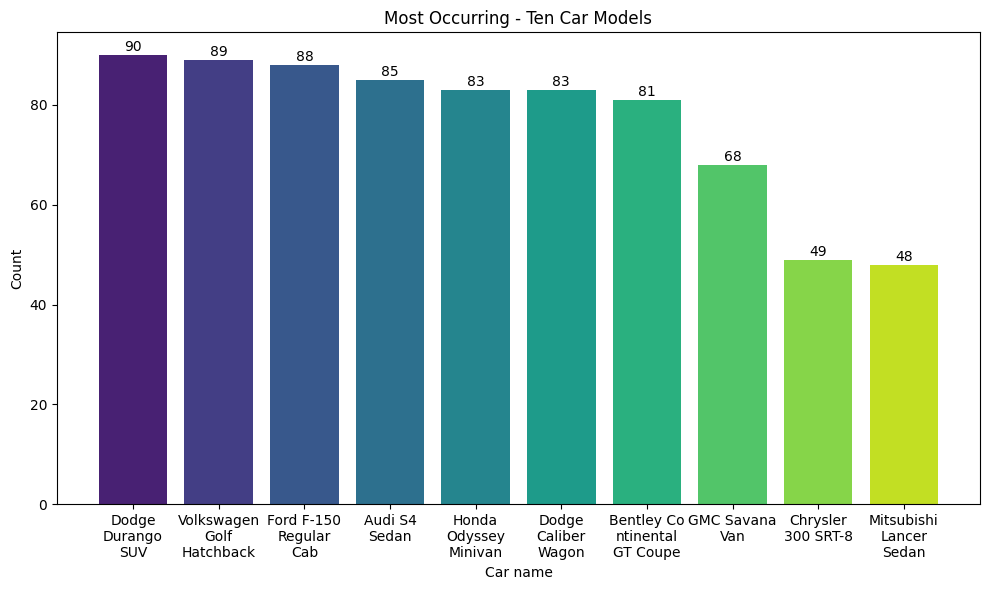

In [ ]:
import matplotlib.pyplot as plt
import textwrap
import seaborn as sns

# Assuming df_val_count is a DataFrame and you want the top 10 entries
top_10 = df_val_count.sort_values(by='count', ascending=False).head(10)

# Generate a color palette using Seaborn
palette = sns.color_palette('viridis', len(top_10))

# Create a bar plot with Matplotlib
plt.figure(figsize=(10, 6))
bars = plt.bar(top_10['car_model'], top_10['count'], color=palette)

# Add the count labels on the bars
for bar in bars:
    height = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        height + 0.1,  # Adjust this multiplier as needed for spacing
        f'{int(height)}',
        ha='center',
        va='bottom'
    )

max_label_length = 10  # Maximum length of each line of text
wrapped_labels = [textwrap.fill(label, max_label_length) for label in top_10['car_model']]
plt.xticks(ticks=range(len(top_10['car_model'])), labels=wrapped_labels, rotation=0)

# Add labels and title
plt.xlabel('Car name')
plt.ylabel('Count')
plt.title('Most Occurring - Ten Car Models')
plt.xticks(rotation=0)  # Rotate x-axis labels if needed

# Show the plot
plt.tight_layout()
plt.show()

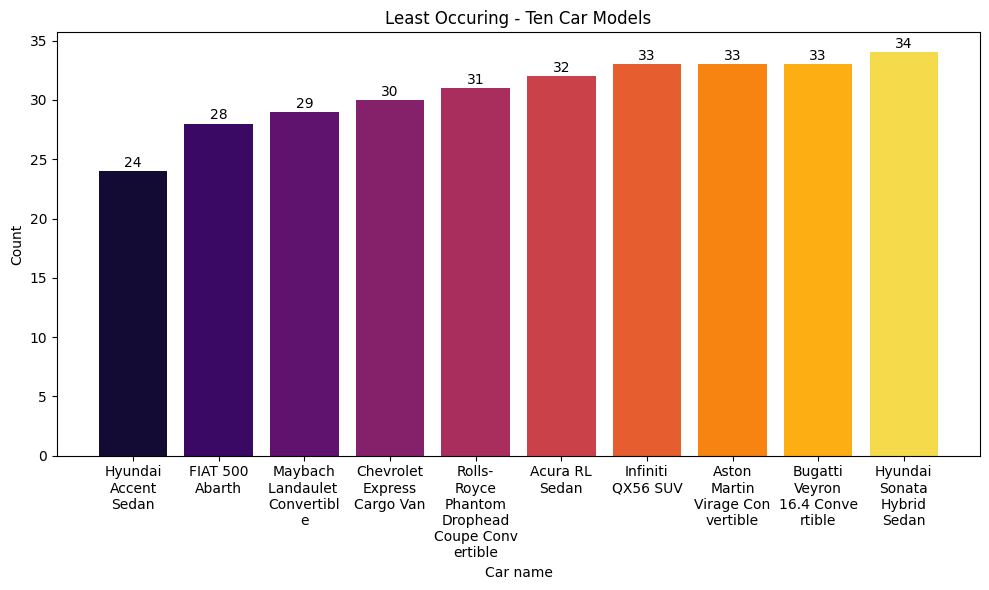

In [ ]:
# Assuming df_val_count is a DataFrame and you want the top 10 entries
bottom_10 = df_val_count.sort_values(by='count', ascending=True).head(10)

# Generate a color palette using Seaborn
palette = sns.color_palette('inferno', len(bottom_10))

# Create a bar plot with Matplotlib
plt.figure(figsize=(10, 6))
bars = plt.bar(bottom_10['car_model'], bottom_10['count'], color=palette)

# Add the count labels on the bars
for bar in bars:
    height = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        height + 0.1,  # Adjust this multiplier as needed for spacing
        f'{int(height)}',
        ha='center',
        va='bottom'
    )

max_label_length = 10  # Maximum length of each line of text
wrapped_labels = [textwrap.fill(label, max_label_length) for label in bottom_10['car_model']]
plt.xticks(ticks=range(len(bottom_10['car_model'])), labels=wrapped_labels, rotation=0)

# Add labels and title
plt.xlabel('Car name')
plt.ylabel('Count')
plt.title('Least Occuring - Ten Car Models')
plt.xticks(rotation=0)  # Rotate x-axis labels if needed

# Show the plot
plt.tight_layout()
plt.show()

It can seen that 'Dodge Durango SUV' is the most occurring cars in the dataset with 90 images and 'Hyundai Accent Sedan' is the least occurring cars in the dataset with 24 images

**Analysis of Car Launch Year**

In [ ]:
##Extracting the launch year from the 'car_name' column
train_annotation_v1['car_launch_year'] = train_annotation_v1['car_name'].str[-4:]
test_annotation_v1['car_launch_year'] = test_annotation_v1['car_name'].str[-4:]

In [ ]:
##Getting the number of records by launch year - Train dataset
sorted_counts_train = train_annotation_v1['car_launch_year'].value_counts().sort_index()

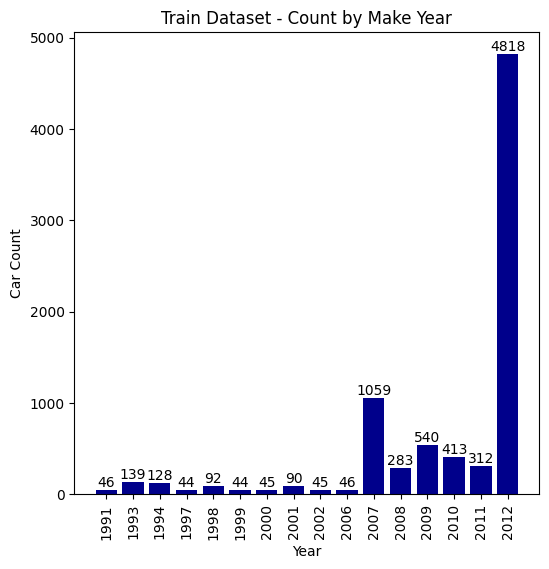

In [ ]:
# Plotting the chart for 'Make year'
years_list_train = sorted_counts_train.index.to_list()
car_counts_train = sorted_counts_train.values

# Create a bar chart
plt.figure(figsize=(6, 6))
bars = plt.bar(years_list_train,car_counts_train, color='darkblue')
plt.xticks(ticks=range(len(years_list_train)), labels=years_list_train, rotation=90)

# Add title and labels
plt.title('Train Dataset - Count by Make Year')
plt.xlabel('Year')
plt.ylabel('Car Count')

# Add data labels on top of each bar
for bar in bars:
    yval = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width() / 2,  # X position (center of the bar)
        yval + 0.5,  # Y position (slightly above the top of the bar)
        int(yval),  # Label text (value of the bar)
        ha='center',  # Horizontal alignment
        va='bottom'  # Vertical alignment
    )

# Show the plot
plt.show()

In [ ]:
sorted_counts_test = test_annotation_v1['car_launch_year'].value_counts().sort_index()

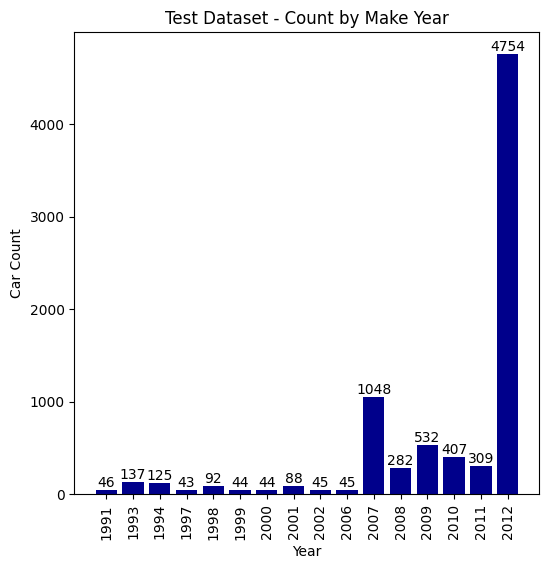

In [ ]:
years_list_test = sorted_counts_test.index.to_list()
car_counts_test = sorted_counts_test.values

# Create a bar chart
plt.figure(figsize=(6, 6))
bars = plt.bar(years_list_test,car_counts_test, color='darkblue')  # Create bars with specified colors

plt.xticks(ticks=range(len(years_list_test)), labels=years_list_test, rotation=90)

# Add title and labels
plt.title('Test Dataset - Count by Make Year')
plt.xlabel('Year')
plt.ylabel('Car Count')


# Add data labels on top of each bar
for bar in bars:
    yval = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width() / 2,  # X position (center of the bar)
        yval + 0.5,  # Y position (slightly above the top of the bar)
        int(yval),  # Label text (value of the bar)
        ha='center',  # Horizontal alignment
        va='bottom'  # Vertical alignment
    )

# Show the plot
plt.show()

The dataset predominantly features cars from the years 2007 to 2012, which make up 90% of the total. Within this range, the years 2007 and 2012 have the highest number of cars.

**Analysis of Car Body Type**

In [ ]:
##Dictionary of keywords to map the cars with the body type

car_types = {
    'SUV': ['SUV', 'Sport Utility Vehicle'],
    'Sedan': ['Sedan'],
    'Coupe': ['Coupe'],
    'Convertible': ['Convertible', 'Conv.'],
    'Hatchback': ['Hatchback'],
    'Minivan': ['Minivan'],
    'Van': ['Van', 'Cargo Van'],
    'Pickup Truck': ['Pickup', 'Crew Cab', 'Extended Cab', 'Regular Cab', 'SuperCab', 'Quad Cab']
}

In [ ]:
## Function to label each car their body type
def label_car_type(car_name):
    for car_type, keywords in car_types.items():
        if any(keyword in car_name for keyword in keywords):
            return car_type

In [ ]:
## Mapping the body type to the car names
train_annotation_v1['car_body_type'] = train_annotation_v1['car_name'].apply(label_car_type)
test_annotation_v1['car_body_type'] = test_annotation_v1['car_name'].apply(label_car_type)

In [ ]:
count_by_car_body_type_train = train_annotation_v1['car_body_type'].value_counts()
car_body_train = count_by_car_body_type_train.index.to_list()
car_body_count_train = count_by_car_body_type_train.values

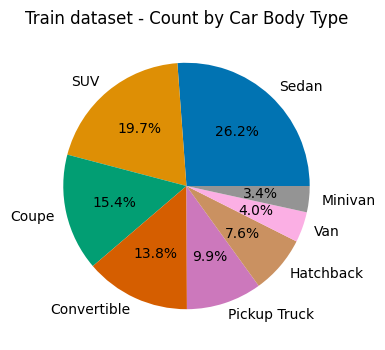

In [ ]:
## Pie chart
colors = sns.color_palette('colorblind', len(car_body_train))

# Create a pie chart
plt.figure(figsize=(4, 4))  # Set the size of the figure (optional)
plt.pie(car_body_count_train, labels=car_body_train, colors = colors, autopct='%1.1f%%', startangle=360)

# Add title
plt.title('Train dataset - Count by Car Body Type')

# Show the plot
plt.show()

In [ ]:
count_by_car_body_type_test = test_annotation_v1['car_body_type'].value_counts()
car_body_test = count_by_car_body_type_test.index.to_list()
car_body_count_test = count_by_car_body_type_test.values

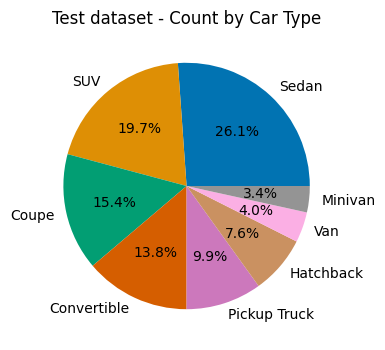

In [ ]:
## Pie chart
colors = sns.color_palette('colorblind', len(car_body_test))

# Create a pie chart
plt.figure(figsize=(4, 4))  # Set the size of the figure (optional)
plt.pie(car_body_count_test, labels=car_body_test, colors = colors, autopct='%1.1f%%', startangle=360)

# Add title
plt.title('Test dataset - Count by Car Type')

# Show the plot
plt.show()

The pie chart shows that the body types 'Sedan,' 'SUV,' 'Coupe,' and 'Convertible' together account for 75% of the dataset, regardless of car brands. Among these, 'Sedan' represents the largest portion at 26%, followed by 'SUV' at 19.7%.

**Analysis of Car Brands**

In [ ]:
# Dictionary to map cars to their corresponding brands
car_brands = {
    'AM General': ['AM General'],
    'Acura': ['Acura'],
    'Aston Martin': ['Aston Martin'],
    'Audi': ['Audi'],
    'BMW': ['BMW'],
    'Bentley': ['Bentley'],
    'Bugatti': ['Bugatti'],
    'Buick': ['Buick'],
    'Cadillac': ['Cadillac'],
    'Chevrolet': ['Chevrolet'],
    'Chrysler': ['Chrysler'],
    'Daewoo': ['Daewoo'],
    'Dodge': ['Dodge'],
    'Eagle': ['Eagle'],
    'FIAT': ['FIAT'],
    'Ferrari': ['Ferrari'],
    'Fisker': ['Fisker'],
    'Ford': ['Ford'],
    'GMC': ['GMC'],
    'Geo': ['Geo'],
    'HUMMER': ['HUMMER'],
    'Honda': ['Honda'],
    'Hyundai': ['Hyundai'],
    'Infiniti': ['Infiniti'],
    'Isuzu': ['Isuzu'],
    'Jaguar': ['Jaguar'],
    'Jeep': ['Jeep'],
    'Lamborghini': ['Lamborghini'],
    'Land Rover': ['Land Rover'],
    'Lincoln': ['Lincoln'],
    'MINI': ['MINI'],
    'Maybach': ['Maybach'],
    'Mazda': ['Mazda'],
    'McLaren': ['McLaren'],
    'Mercedes-Benz': ['Mercedes-Benz'],
    'Mitsubishi': ['Mitsubishi'],
    'Nissan': ['Nissan'],
    'Plymouth': ['Plymouth'],
    'Porsche': ['Porsche'],
    'Ram': ['Ram'],
    'Rolls-Royce': ['Rolls-Royce'],
    'Scion': ['Scion'],
    'Spyker': ['Spyker'],
    'Suzuki': ['Suzuki'],
    'Tesla': ['Tesla'],
    'Toyota': ['Toyota'],
    'Volkswagen': ['Volkswagen'],
    'Volvo': ['Volvo'],
    'smart': ['smart']
}

# Function to categorize a car brand
def categorize_brand(car_name):
    for car_brand, keywords in car_brands.items():
        if any(keyword in car_name for keyword in keywords):
            return car_brand

In [ ]:
train_annotation_v1['car_brand'] = train_annotation_v1['car_name'].apply(categorize_brand)
test_annotation_v1['car_brand'] = test_annotation_v1['car_name'].apply(categorize_brand)

In [ ]:
# Top 10 brands with the highest count - Train Dataset
top_brands = train_annotation_v1['car_brand'].value_counts().head(10).index

filtered_df = train_annotation_v1[train_annotation_v1['car_brand'].isin(top_brands)]

brand_body_counts = filtered_df.groupby(['car_brand', 'car_body_type']).size().reset_index(name='count')

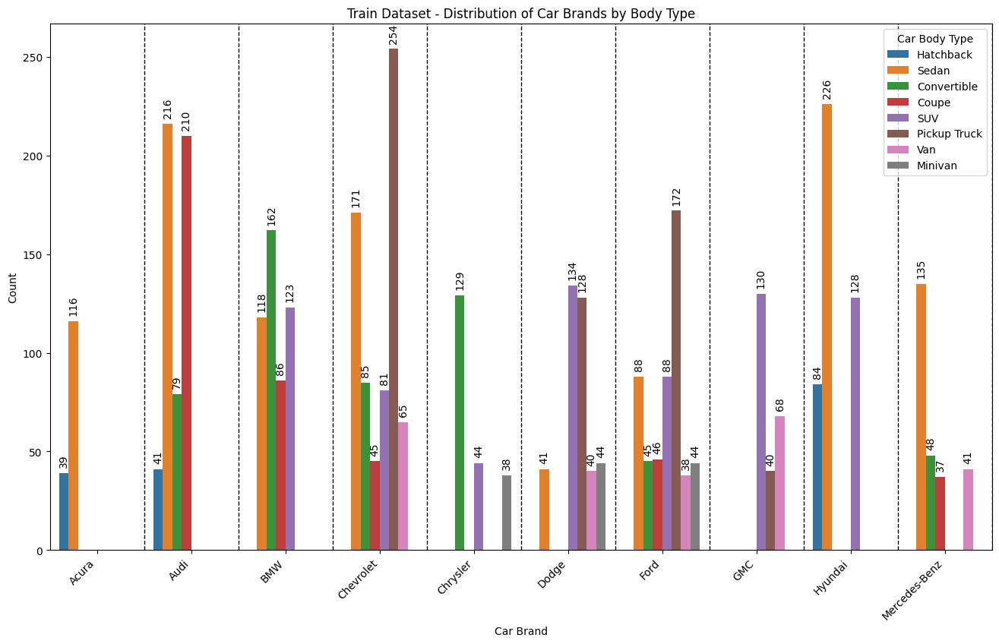

In [ ]:
# Create a clustered bar chart
plt.figure(figsize=(16, 9))
ax = sns.barplot(data=brand_body_counts, x='car_brand', y='count', hue='car_body_type', palette='tab10')

# Rotate x-axis labels for better readability
plt.xticks(rotation=45, ha='right')

# Draw vertical lines between bars
for tick in ax.get_xticks():
    ax.axvline(x=tick + 0.5, color='black', linestyle='--', linewidth=1)

# Add data labels
for container in ax.containers:
    # Iterate over each bar in the container
    for bar in container:
        # Get the height of the bar
        height = bar.get_height()
        # Add a label on top of the bar
        ax.text(
            bar.get_x() + bar.get_width() / 2,  # X position (center of the bar)
            height+(3),  # Y position (top of the bar)
            f'{int(height)}',  # Text label
            ha='center',  # Horizontal alignment
            va='bottom',  # Vertical alignment
            fontsize=10,
            rotation=90 # Font size
        )

# Add title and labels
plt.title('Train Dataset - Distribution of Car Brands by Body Type')
plt.xlabel('Car Brand')
plt.ylabel('Count')
plt.legend(title='Car Body Type')

# Show the plot
plt.show()

In [ ]:
# Top 10 brands with the highest count - Test Dataset
top_brands_test = test_annotation_v1['car_brand'].value_counts().head(10).index

filtered_df_test = test_annotation_v1[test_annotation_v1['car_brand'].isin(top_brands_test)]

brand_body_counts_test = filtered_df_test.groupby(['car_brand', 'car_body_type']).size().reset_index(name='count')

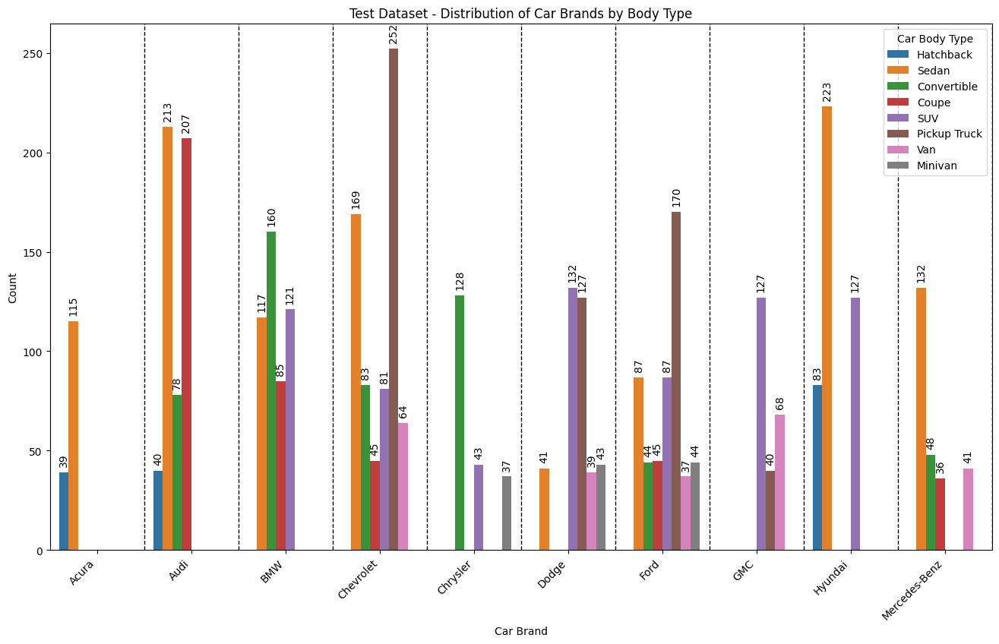

In [ ]:
# Create a clustered bar chart
plt.figure(figsize=(16, 9))
ax = sns.barplot(data=brand_body_counts_test, x='car_brand', y='count', hue='car_body_type', palette='tab10')

# Rotate x-axis labels for better readability
plt.xticks(rotation=45, ha='right')

# Draw vertical lines between bars
for tick in ax.get_xticks():
    ax.axvline(x=tick + 0.5, color='black', linestyle='--', linewidth=1)

# Add data labels
for container in ax.containers:
    # Iterate over each bar in the container
    for bar in container:
        # Get the height of the bar
        height = bar.get_height()
        # Add a label on top of the bar
        ax.text(
            bar.get_x() + bar.get_width() / 2,  # X position (center of the bar)
            height+(3),  # Y position (top of the bar)
            f'{int(height)}',  # Text label
            ha='center',  # Horizontal alignment
            va='bottom',  # Vertical alignment
            fontsize=10,
            rotation=90 # Font size
        )

# Add title and labels
plt.title('Test Dataset - Distribution of Car Brands by Body Type')
plt.xlabel('Car Brand')
plt.ylabel('Count')
plt.legend(title='Car Body Type')

# Show the plot
plt.show()

1. It can seen from the analysis, the ‘Chrevolet’ is the most occurring brand wherein ‘Pickup Truck’ is the most occurring car type followed by ‘Audi’ wherein ‘ Sedan’ and ‘coupe’ are the most occurring body type
2. While brands like 'Acura', 'Chrysler' and 'GMC' have specific car type representations like Hatchback and Sedan for Acura and Convertible, SUV and Minivan for Chrysler and SUV, Pickup Truck and Van for GMC

# Part 3: Map Training and Testing Images to Their Classes

In [ ]:
def get_image_class_map(image_path):
    image_class_map = {}
    for root, dirs, files in os.walk(image_path):
        # Filter out hidden directories
        dirs[:] = [d for d in dirs if not d.startswith('.')]
        for file in files:
            if file.endswith('.jpg') or file.endswith('.png'):
                class_name = os.path.basename(root)
                image_class_map[file] = class_name
    return image_class_map

train_image_class_map = get_image_class_map(train_images_path)
test_image_class_map = get_image_class_map(test_images_path)

print(f"Number of training images: {len(train_image_class_map)}")
print(f"Number of testing images: {len(test_image_class_map)}")

Number of training images: 8144
Number of testing images: 8041


In [ ]:
## Retriving the car class names for random training images
train_image_class_map.get('00001.jpg')

'Audi TTS Coupe 2012'

In [ ]:
## Retriving the car class names for random testing images
test_image_class_map.get('00001.jpg')

'Suzuki Aerio Sedan 2007'

# Part 4: Map Training and Testing Images to Their Annotations

In [ ]:
def get_image_annotations(image_class_map, annotations):
    image_annotations_map = {}
    for index, row in annotations.iterrows():
        image_name = row['image_name'] ## car image name
        image_class = row['image_class'] ## car class - number
        if image_name in image_class_map:
            bbox = [row['x_min'], row['y_min'], row['x_max'], row['y_max']]
            image_car_name = image_class_map[image_name]
            image_annotations_map[image_name] = (bbox, image_car_name,image_class)
    return image_annotations_map

train_image_annotations_map = get_image_annotations(train_image_class_map, train_annotations)
test_image_annotations_map = get_image_annotations(test_image_class_map, test_annotations)

print(f"Number of training images: {len(train_image_annotations_map)}")
print(f"Number of testing images: {len(test_image_annotations_map)}")

Number of training images: 8144
Number of testing images: 8041


In [ ]:
## Retriving the annotations, car class and name for random training images
train_image_annotations_map.get('00001.jpg')

([39, 116, 569, 375], 'Audi TTS Coupe 2012', 14)

In [ ]:
## Retriving the annotations, car class and name for random testing images
test_image_annotations_map.get('00001.jpg')

([30, 52, 246, 147], 'Suzuki Aerio Sedan 2007', 181)

## Step 4: Display images with bounding box

In [ ]:
import cv2
import matplotlib.pyplot as plt

def display_image_with_bbox(image_path, bbox, car_model,color=cv2.COLOR_BGR2RGB):
    # Read the image
    img = cv2.imread(image_path)

    # Ensure bbox coordinates are integers
    x_min, y_min, x_max, y_max = map(int, bbox)

    # Draw the bounding box
    img_with_bbox = cv2.rectangle(img.copy(), (x_min, y_min), (x_max, y_max), (0, 255, 0), 2)

    # Display car model name on the image
    img_with_bbox = cv2.putText(img_with_bbox, car_model, (x_min, y_min - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 255, 0), 2)

    # Convert BGR to RGB for displaying with matplotlib
    img_with_bbox_rgb = cv2.cvtColor(img_with_bbox, color)

    # Display the image
    plt.imshow(img_with_bbox_rgb)
    plt.show()

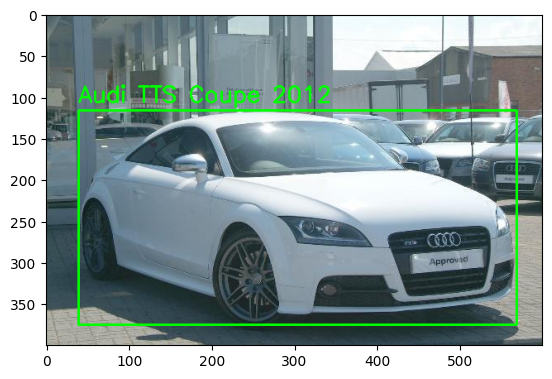

In [ ]:
first_image = list(train_image_annotations_map.keys())[0]
first_image_bbox, first_image_model,first_image_class = train_image_annotations_map[first_image]
display_image_with_bbox(os.path.join(train_images_path, first_image_model, first_image), first_image_bbox, first_image_model)

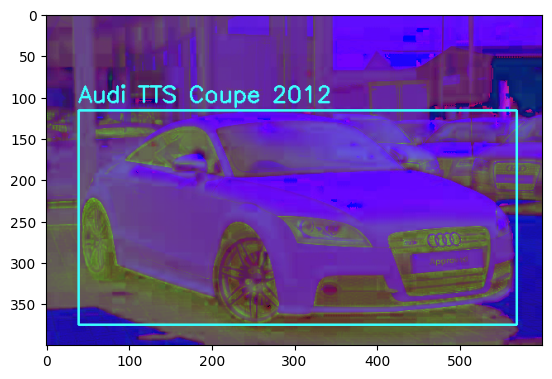

In [ ]:
first_image = list(train_image_annotations_map.keys())[0]
first_image_bbox, first_image_model,first_image_class  = train_image_annotations_map[first_image]
display_image_with_bbox(os.path.join(train_images_path, first_image_model, first_image), first_image_bbox, first_image_model,color=cv2.COLOR_BGR2HSV)

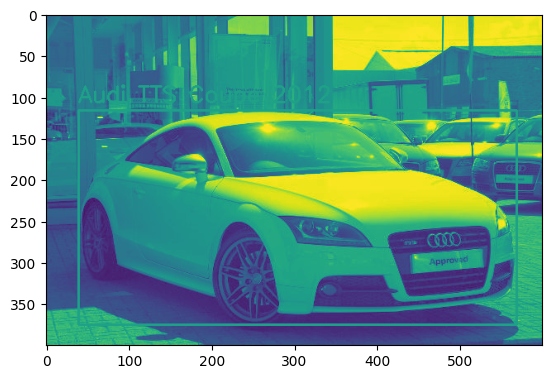

In [ ]:
first_image = list(train_image_annotations_map.keys())[0]
first_image_bbox, first_image_model,first_image_class  = train_image_annotations_map[first_image]
display_image_with_bbox(os.path.join(train_images_path, first_image_model, first_image), first_image_bbox, first_image_model,color=cv2.COLOR_BGR2GRAY)

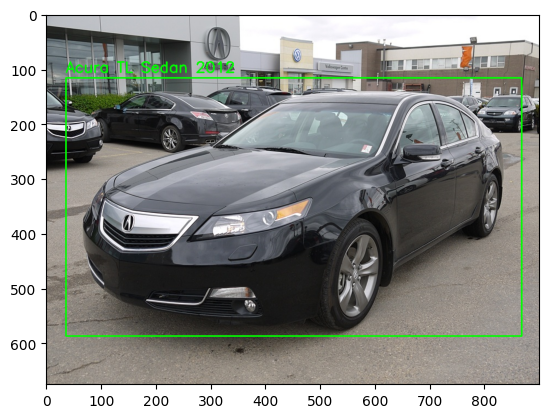

In [ ]:
first_image = list(train_image_annotations_map.keys())[1]
first_image_bbox, first_image_model,first_image_class  = train_image_annotations_map[first_image]
display_image_with_bbox(os.path.join(train_images_path, first_image_model, first_image), first_image_bbox, first_image_model)

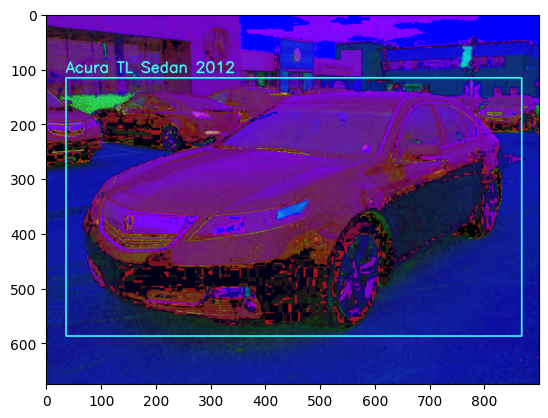

In [ ]:
first_image = list(train_image_annotations_map.keys())[1]
first_image_bbox, first_image_model,first_image_class  = train_image_annotations_map[first_image]
display_image_with_bbox(os.path.join(train_images_path, first_image_model, first_image), first_image_bbox, first_image_model,color=cv2.COLOR_BGR2HSV)

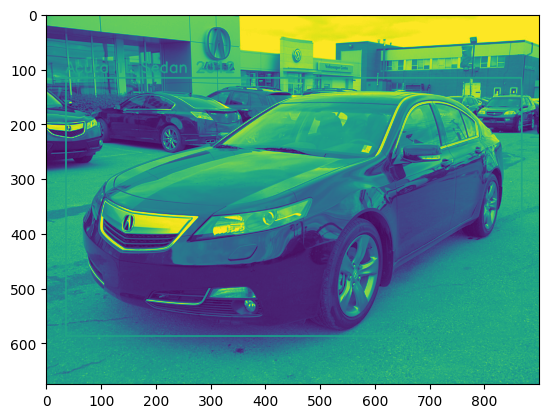

In [ ]:
first_image = list(train_image_annotations_map.keys())[1]
first_image_bbox, first_image_model,first_image_class  = train_image_annotations_map[first_image]
display_image_with_bbox(os.path.join(train_images_path, first_image_model, first_image), first_image_bbox, first_image_model,color=cv2.COLOR_BGR2GRAY)

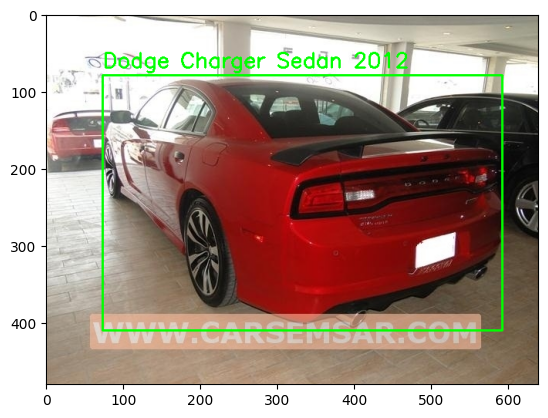

In [ ]:
first_image = list(train_image_annotations_map.keys())[7]
first_image_bbox, first_image_model,first_image_class  = train_image_annotations_map[first_image]
display_image_with_bbox(os.path.join(train_images_path, first_image_model, first_image), first_image_bbox, first_image_model)

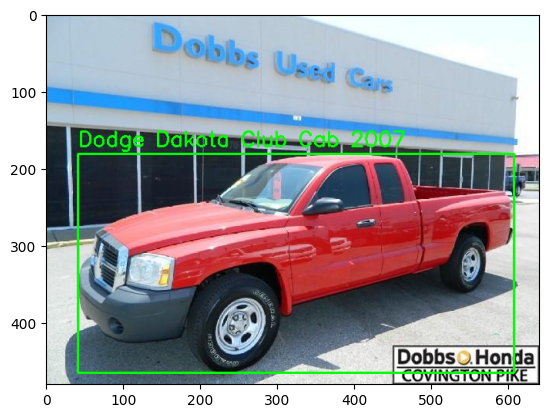

In [ ]:
first_image = list(train_image_annotations_map.keys())[50]
first_image_bbox, first_image_model,first_image_class  = train_image_annotations_map[first_image]
display_image_with_bbox(os.path.join(train_images_path, first_image_model, first_image), first_image_bbox, first_image_model)

# Part 5: Upsampling the data

## Checking for the number of images in each class

In [ ]:
import os
import pandas as pd

def count_images_in_folders(directory_path):
    # List to store folder names and image counts
    folder_image_counts = []

    # Iterate through each folder inside the main directory
    for folder_name in os.listdir(directory_path):
        folder_path = os.path.join(directory_path, folder_name)

        # Check if it's a directory (folder)
        if os.path.isdir(folder_path):
            # Count the number of images in the folder
            image_count = len([file for file in os.listdir(folder_path) if file.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif'))])
            folder_image_counts.append((folder_name, image_count))

    # Convert the list to a DataFrame
    df = pd.DataFrame(folder_image_counts, columns=['Folder', 'Image Count'])
    return df

In [ ]:
# Specify the path to the main directory containing the folders with images
main_directory_path = "/Users/sathish/Documents/Machine_Learning/CarDetectionProject1/Car_Images/car_images_upsampled"

# Get the counts of images in each folder and save it to a DataFrame
image_counts_df = count_images_in_folders(main_directory_path)

# Print the DataFrame
print(image_counts_df)

# Optionally, save the DataFrame to a CSV file
output_csv_path = '/Users/sathish/Documents/Machine_Learning/CarDetectionProject1/Car_Images/image_counts_by_folder.csv'
image_counts_df.to_csv(output_csv_path, index=False)

                                         Folder  Image Count
0                    Dodge Dakota Crew Cab 2010           41
1                  GMC Canyon Extended Cab 2012           40
2                     Hyundai Santa Fe SUV 2012           42
3                        Dodge Durango SUV 2012           44
4    Chevrolet Silverado 1500 Extended Cab 2012           44
..                                          ...          ...
191                    Tesla Model S Sedan 2012           39
192                         GMC Savana Van 2012           68
193                  Chevrolet Express Van 2007           35
194                   Hyundai Veracruz SUV 2012           42
195                 Chevrolet Corvette ZR1 2012           47

[196 rows x 2 columns]


## Augmenting the images to fill in for class imbalance

To rectify the class imbalance, first the number of images per class is recorded to identify the highest number. With the highest number as a threshold, function is created to look for classes with numbers less than the threshold and take the existing images from the classes to augment it and store it until the number of samples/images per class reaches the threshold

In [ ]:
## Checking for the image counts in the each image class

import os
import shutil
import numpy as np
import cv2
from tensorflow.keras.preprocessing.image import ImageDataGenerator

def count_images_in_folders(directory_path):
    folder_image_counts = []

    for folder_name in os.listdir(directory_path):
        folder_path = os.path.join(directory_path, folder_name)

        if os.path.isdir(folder_path):
            image_count = len([file for file in os.listdir(folder_path) if file.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif'))])
            folder_image_counts.append((folder_name, image_count))

    return folder_image_counts

In [ ]:
## Augmenting images and add it to classes where the images are least

import os
import cv2
import numpy as np
from tensorflow.keras.preprocessing.image import ImageDataGenerator

def augment_images(class_folder, target_count, datagen):
    # Print the folder name being augmented
    print(f"Augmenting images in folder: {os.path.basename(class_folder)}")

    images = [cv2.imread(os.path.join(class_folder, img)) for img in os.listdir(class_folder) if img.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif'))]
    current_count = len(images)
    img_index = 0  # Track the index of the image to be augmented

    while current_count < target_count:
        x = np.expand_dims(images[img_index], axis=0)

        # Generate and save one image
        for _ in datagen.flow(x, batch_size=1, save_to_dir=class_folder, save_prefix='aug', save_format='jpeg'):
            current_count += 1
            print(f"Augmenting image {img_index + 1} in folder {os.path.basename(class_folder)}")
            break  # Break after one image is generated and saved

        # Move to the next image, wrap around if needed
        img_index = (img_index + 1) % len(images)

In [ ]:
# Path to the main directory containing the folders with images
main_directory_path = "/Users/sathish/Documents/Machine_Learning/CarDetectionProject1/Car_Images/car_images_upsampled"

# Target count of images for each folder
target_count = 68

# Create an ImageDataGenerator for augmentation
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

In [ ]:
# Count images in each folder and augment if necessary
folder_image_counts = count_images_in_folders(main_directory_path)

for folder_name, count in folder_image_counts:
    if count < target_count:
        class_folder = os.path.join(main_directory_path, folder_name)
        augment_images(class_folder, target_count, datagen)

# Part 6: Design, train and test basic CNN models to classify the car

## Object Classification - Models
## 1a. Basic CNN Model - With Imbalanced Data

In [ ]:
train_images_path = "/Users/sathish/Documents/Machine_Learning/CarDetectionProject1/Car_Images/Train_Images"
test_images_path = "/Users/sathish/Documents/Machine_Learning/CarDetectionProject1/Car_Images/Test_Images"

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_datagen = ImageDataGenerator(rescale=1./255,rotation_range=10,horizontal_flip=True)

train_generator = train_datagen.flow_from_directory(
    train_images_path,
    target_size=(128, 128),
    batch_size=32,
    class_mode='categorical'
)

test_datagen = ImageDataGenerator(rescale=1./255,rotation_range=10,horizontal_flip=True)

test_generator = test_datagen.flow_from_directory(
    test_images_path,
    target_size=(128, 128),
    batch_size=32,
    class_mode='categorical'
)

Found 8144 images belonging to 196 classes.
Found 8041 images belonging to 196 classes.


In [ ]:
from keras.layers import Input, Conv2D, MaxPooling2D, Flatten, Dense
from keras.models import Sequential

In [ ]:
num_classes = 196

model = Sequential([
    Input(shape=(128, 128, 3)),  # Specify input shape with Input layer
    Conv2D(32, (3, 3), activation='relu'),
    MaxPooling2D(2, 2),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D(2, 2),
    Flatten(),
    Dense(128, activation='relu'),
    Dense(num_classes, activation='softmax')  # Set the correct number of output classes
])

model.summary()


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 126, 126, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 63, 63, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 61, 61, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 30, 30, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 57600)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │       7,372,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 196)                 │          25,284 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,417,604 (28.30 MB)

 Trainable params: 7,417,604 (28.30 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
# Train the model using the data generators:
history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    epochs=30,
    validation_data=test_generator,
    validation_steps=test_generator.samples // test_generator.batch_size
)

Epoch 1/30
254/254 ━━━━━━━━━━━━━━━━━━━━ 204s 784ms/step - accuracy: 0.0058 - loss: 5.3022 - val_accuracy: 0.0207 - val_loss: 5.1462
Epoch 2/30
254/254 ━━━━━━━━━━━━━━━━━━━━ 0s 229us/step - accuracy: 0.0312 - loss: 2.5009 - val_accuracy: 0.1111 - val_loss: 2.5746
Epoch 3/30
254/254 ━━━━━━━━━━━━━━━━━━━━ 201s 781ms/step - accuracy: 0.0224 - loss: 5.1021 - val_accuracy: 0.0213 - val_loss: 5.0782
Epoch 4/30
254/254 ━━━━━━━━━━━━━━━━━━━━ 0s 154us/step - accuracy: 0.0000e+00 - loss: 2.6075 - val_accuracy: 0.0000e+00 - val_loss: 2.5096
Epoch 5/30
254/254 ━━━━━━━━━━━━━━━━━━━━ 259s 1s/step - accuracy: 0.0448 - loss: 4.8936 - val_accuracy: 0.0322 - val_loss: 4.9624
Epoch 6/30
254/254 ━━━━━━━━━━━━━━━━━━━━ 0s 147us/step - accuracy: 0.0312 - loss: 2.3345 - val_accuracy: 0.0000e+00 - val_loss: 2.4064
Epoch 7/30
254/254 ━━━━━━━━━━━━━━━━━━━━ 254s 995ms/step - accuracy: 0.0833 - loss: 4.5127 - val_accuracy: 0.0380 - val_loss: 4.9792
Epoch 8/30
254/254 ━━━━━━━━━━━━━━━━━━━━ 0s 144us/step - accuracy: 0.0625 

In [ ]:
# Evaluate the model on the test data
test_loss, test_acc = model.evaluate(test_generator)
print(f"Test accuracy: {test_acc * 100:.2f}%")

train_loss, train_acc = model.evaluate(train_generator)
print(f"Train accuracy: {train_acc * 100:.2f}%")

252/252 ━━━━━━━━━━━━━━━━━━━━ 165s 655ms/step - accuracy: 0.0572 - loss: 7.4204
Test accuracy: 6.02%
255/255 ━━━━━━━━━━━━━━━━━━━━ 168s 658ms/step - accuracy: 0.7952 - loss: 0.9014
Train accuracy: 79.10%


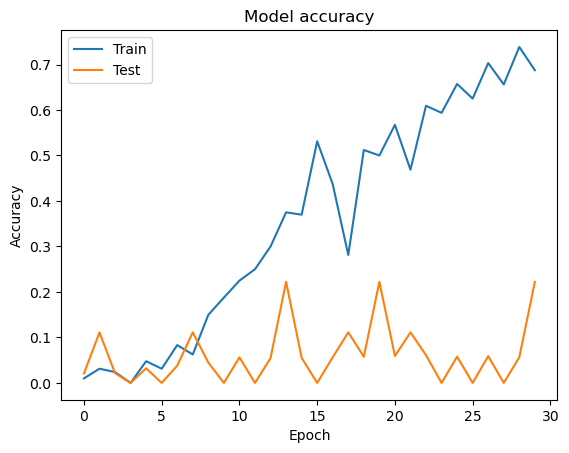

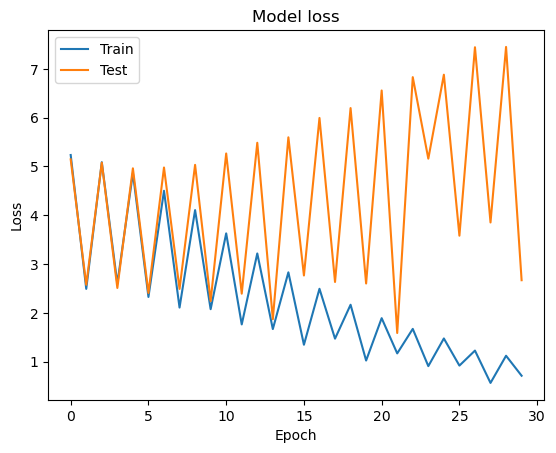

In [ ]:
import matplotlib.pyplot as plt

# Plot training & validation accuracy values
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()


## 1b. CNN Model - With Upsampled Data

In [ ]:
train_images_upsampled_path = "/Users/sathish/Documents/Machine_Learning/CarDetectionProject1/Car_Images/car_images_upsampled"
test_images_path_dup = "/Users/sathish/Documents/Machine_Learning/CarDetectionProject1/Car_Images/Test_Images"

In [ ]:
from keras.utils import Sequence

class MyDataset(Sequence):
    def __init__(self, **kwargs):
        super().__init__(**kwargs)
        # Additional initialization for the dataset
        self.directory = kwargs.get('directory')
        self.target_size = kwargs.get('target_size')
        self.batch_size = kwargs.get('batch_size')
        self.class_mode = kwargs.get('class_mode')
        # Initialize other parameters or dataset specifics

    def __len__(self):
        # Return the number of batches per epoch
        pass

    def __getitem__(self, index):
        # Return a batch of data
        pass

    def on_epoch_end(self):
        # Optional: Shuffle data or perform other operations at the end of each epoch
        pass

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Ensure the number of classes is correctly set
num_classes = 196

# Prepare the data using ImageDataGenerator
train_datagen_upsampled = ImageDataGenerator(rescale=1./255,
                                   validation_split=0.2)

# Prepare training and validation generators
train_generator_upsampled = train_datagen_upsampled.flow_from_directory(
    directory=train_images_upsampled_path,
    target_size=(256, 256),
    batch_size=32,
    class_mode='categorical',
    subset='training'
)

# Prepare training and validation generators
validation_generator_upsampled = train_datagen_upsampled.flow_from_directory(
    directory=train_images_upsampled_path,
    target_size=(256, 256),
    batch_size=32,
    class_mode='categorical',
    subset='validation'
)

Found 10769 images belonging to 196 classes.
Found 2548 images belonging to 196 classes.


In [ ]:
test_datagen_dup = ImageDataGenerator(
        rescale=1./255)

test_generator_dup = test_datagen_dup.flow_from_directory(
        test_images_path_dup,
        target_size=(256,256),
        class_mode="categorical",
        batch_size=32
)

Found 8041 images belonging to 196 classes.


In [ ]:
from tensorflow.keras.optimizers import Adam, SGD
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras.layers import BatchNormalization, Dense, Dropout, Flatten, Conv2D, MaxPooling2D, Conv2DTranspose,UpSampling2D, AveragePooling2D
from tensorflow.keras import layers, models
from tensorflow.keras.layers import Activation

In [ ]:
from tensorflow.keras.initializers import GlorotNormal,GlorotUniform,HeNormal,HeUniform

initializer = HeNormal()

In [ ]:
model_2 = models.Sequential()

model_2.add(layers.Input(shape=(256, 256, 3)))

model_2.add(Conv2D(64,(3,3),name='conv2d_64_3by3', kernel_initializer=initializer))
model_2.add(Conv2D(64,(3,3),name='conv2d_64_3by3_1', kernel_initializer=initializer))
# model.add(BatchNormalization())
model_2.add(Activation('relu'))
model_2.add(MaxPooling2D((2,2),name='maxpool2d_1'))

model_2.add(Conv2D(128,(3,3),name='conv2d_128_3by3', kernel_initializer=initializer))
model_2.add(Conv2D(128,(3,3),name='conv2d_128_3by3_1', kernel_initializer=initializer))
# model.add(BatchNormalization())
model_2.add(Activation('relu'))
model_2.add(MaxPooling2D((2,2),name='maxpool2d_2'))

model_2.add(Conv2D(512,(3,3),name='conv2d_512_3by3', kernel_initializer=initializer))
# model.add(BatchNormalization())
model_2.add(Activation('relu'))
model_2.add(MaxPooling2D((2,2),name='maxpool2d_3'))

model_2.add(Conv2D(512,(3,3),name='conv2d_512_3by3_1', kernel_initializer=initializer))
# model.add(BatchNormalization())
model_2.add(Activation('relu'))
model_2.add(MaxPooling2D((2,2),name='maxpool2d_4'))

# model.add(Conv2D(1024,(3,3),name='conv2d_1024_3by3', kernel_initializer=initializer))
# # model.add(BatchNormalization())
# model.add(Activation('relu'))
# model.add(MaxPooling2D((2,2),name='avgpool2d_4'))

model_2.add(layers.Flatten())
# model.add(layers.Dense(512,activation='relu',kernel_initializer = initializer))
# model.add(Dropout(0.2))
model_2.add(layers.Dense(256,activation='relu',kernel_initializer = initializer))
model_2.add(Dropout(0.2))
model_2.add(layers.Dense(128,activation='relu',kernel_initializer = initializer))
model_2.add(Dropout(0.2))
model_2.add(layers.Dense(64,activation='relu',kernel_initializer = initializer))

model_2.add(layers.Dense(196,activation='softmax'))

In [ ]:
model_2.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_64_3by3 (Conv2D)              │ (None, 254, 254, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_64_3by3_1 (Conv2D)            │ (None, 252, 252, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_4 (Activation)            │ (None, 252, 252, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ maxpool2d_1 (MaxPooling2D)           │ (None, 126, 126, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_128_3by3 (Conv2D)             │ (None, 124, 124, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_128_3by3_1 (Conv2D)           │ (None, 122, 122, 128)       │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_5 (Activation)            │ (None, 122, 122, 128)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ maxpool2d_2 (MaxPooling2D)           │ (None, 61, 61, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_512_3by3 (Conv2D)             │ (None, 59, 59, 512)         │         590,336 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_6 (Activation)            │ (None, 59, 59, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ maxpool2d_3 (MaxPooling2D)           │ (None, 29, 29, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_512_3by3_1 (Conv2D)           │ (None, 27, 27, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_7 (Activation)            │ (None, 27, 27, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ maxpool2d_4 (MaxPooling2D)           │ (None, 13, 13, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 86528)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 256)                 │      22,151,424 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 128)                 │          32,896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6 (Dense)                      │ (None, 64)                  │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7 (Dense)                      │ (None, 196)                 │          12,740 │
└──────────────────────────────────────┴─────────────────────────────┴──────────────

 Total params: 25,415,620 (96.95 MB)

 Trainable params: 25,415,620 (96.95 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
from tensorflow.keras.optimizers import Adam, SGD
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint


sgd_optimizer = SGD(learning_rate=0.01,momentum=0.9)

model_2.compile(optimizer=sgd_optimizer,loss=['categorical_crossentropy'],metrics=['accuracy'])

In [ ]:
# Train the model using the data generators:
history = model_2.fit(
    train_generator_upsampled,
    steps_per_epoch=train_generator_upsampled.samples // train_generator_upsampled.batch_size,
    epochs=15,
    validation_data=validation_generator_upsampled,
    validation_steps=validation_generator_upsampled.samples // validation_generator_upsampled.batch_size
)

Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


336/336 ━━━━━━━━━━━━━━━━━━━━ 3282s 10s/step - accuracy: 0.0054 - loss: 5.3909 - val_accuracy: 0.0055 - val_loss: 5.2775
Epoch 2/15
  1/336 ━━━━━━━━━━━━━━━━━━━━ 2:11 391ms/step - accuracy: 0.0312 - loss: 5.2716

/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


336/336 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - accuracy: 0.0312 - loss: 5.2716 - val_accuracy: 0.0000e+00 - val_loss: 5.2771
Epoch 3/15
336/336 ━━━━━━━━━━━━━━━━━━━━ 143s 421ms/step - accuracy: 0.0072 - loss: 5.2663 - val_accuracy: 0.0055 - val_loss: 5.2217
Epoch 4/15
336/336 ━━━━━━━━━━━━━━━━━━━━ 0s 255us/step - accuracy: 0.0000e+00 - loss: 5.2708 - val_accuracy: 0.0000e+00 - val_loss: 5.3092
Epoch 5/15
336/336 ━━━━━━━━━━━━━━━━━━━━ 142s 419ms/step - accuracy: 0.0099 - loss: 5.2180 - val_accuracy: 0.0095 - val_loss: 5.1948
Epoch 6/15
336/336 ━━━━━━━━━━━━━━━━━━━━ 0s 279us/step - accuracy: 0.0000e+00 - loss: 5.1306 - val_accuracy: 0.0000e+00 - val_loss: 5.2826
Epoch 7/15
336/336 ━━━━━━━━━━━━━━━━━━━━ 142s 418ms/step - accuracy: 0.0091 - loss: 5.1801 - val_accuracy: 0.0075 - val_loss: 5.1998
Epoch 8/15
336/336 ━━━━━━━━━━━━━━━━━━━━ 0s 244us/step - accuracy: 0.0000e+00 - loss: 5.2337 - val_accuracy: 0.0000e+00 - val_loss: 5.2786
Epoch 9/15
336/336 ━━━━━━━━━━━━━━━━━━━━ 142s 418ms/step - accuracy:

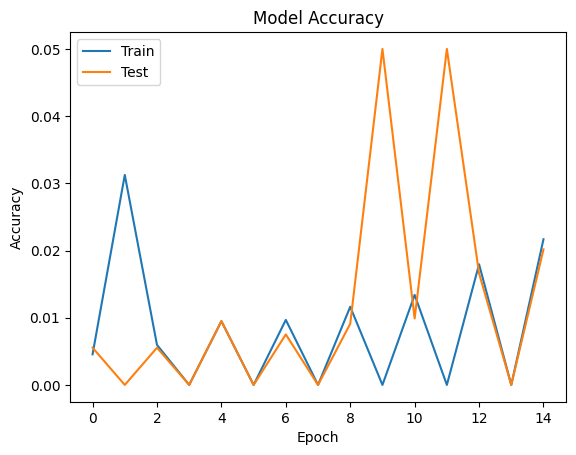

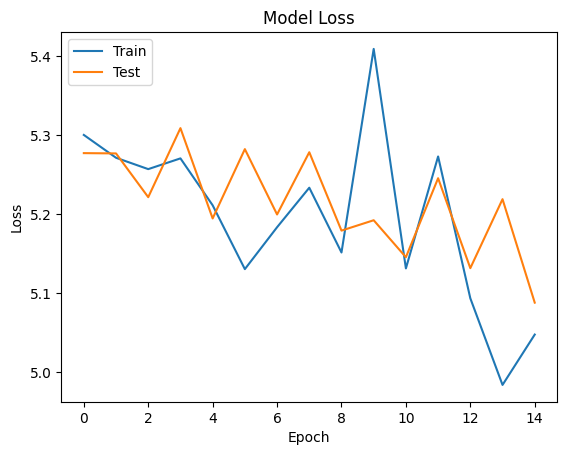

In [ ]:
import matplotlib.pyplot as plt

# Plot training & validation accuracy values
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

In [ ]:
# Predict on the test dataset
predictions = model_2.predict(test_generator_dup, verbose=1)

252/252 ━━━━━━━━━━━━━━━━━━━━ 3371s 13s/step


In [ ]:
# Get the predicted class indices
predicted_classes = np.argmax(predictions, axis=1)

In [ ]:
class_indices = {v: k for k, v in test_generator_dup.class_indices.items()}  # Inverse mapping
predicted_labels = [class_indices[i] for i in predicted_classes]

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix

true_classes = test_generator_dup.classes
class_labels = list(test_generator_dup.class_indices.keys())

# Print classification report
print(classification_report(true_classes, predicted_classes, target_names=class_labels))

                                                        precision    recall  f1-score   support

                            AM General Hummer SUV 2000       0.00      0.02      0.01        44
                             Acura Integra Type R 2001       0.02      0.02      0.02        44
                                   Acura RL Sedan 2012       0.00      0.00      0.00        32
                                   Acura TL Sedan 2012       0.00      0.00      0.00        43
                                  Acura TL Type-S 2008       0.00      0.00      0.00        42
                                  Acura TSX Sedan 2012       0.00      0.00      0.00        40
                              Acura ZDX Hatchback 2012       0.00      0.00      0.00        39
              Aston Martin V8 Vantage Convertible 2012       0.00      0.00      0.00        45
                    Aston Martin V8 Vantage Coupe 2012       0.00      0.00      0.00        41
                  Aston Martin Virage C

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Observations:
1. With class imbalance and simple augmentations to the training dataset, the model reaches 75% accuracy for training and 22% for validation. These numbers are not consistent throughout the epochs. In terms of loss, it can be seen that the loss has decreased for training and increased for validation dataset
2. By upsampling the training data, and the 25.4 M parameters model has produced 2% accuracy for training and 2% for validation dataset. These numbers are consistent throughout the epochs. With more computational resources and training time, model could produce better accuracy

##2a. ResNet50 Model - With Imbalanced Data

In [ ]:
# Loading the Resnet50 model into the notebook # Adding custom layers to the replace the fully connected layers to match the number of classes
# Running the final model
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam
import tensorflow as tf

base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(128, 128, 3))

# Add custom layers on top of the base model
x = base_model.output
x = Flatten()(x)
x = Dense(512, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(train_generator.num_classes, activation='softmax')(x)

# Create the final model
model_Resnet = tf.keras.Model(inputs=base_model.input, outputs=predictions)

# Compile the model
model_Resnet.compile(optimizer=Adam(learning_rate=1e-4),
              loss='categorical_crossentropy',  # or 'sparse_categorical_crossentropy' depending on your labels
              metrics=['accuracy'])

# Fit the model
history_Resnet = model_Resnet.fit(
    train_generator,
    validation_data=test_generator,
    epochs=30,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    validation_steps=test_generator.samples // test_generator.batch_size
)


Epoch 1/30


/Users/sathish/Documents/Machine_Learning/Virtual_Env/ml_Project1/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


254/254 ━━━━━━━━━━━━━━━━━━━━ 887s 3s/step - accuracy: 0.0066 - loss: 5.8069 - val_accuracy: 0.0051 - val_loss: 5.3350
Epoch 2/30
  1/254 ━━━━━━━━━━━━━━━━━━━━ 11:28 3s/step - accuracy: 0.0000e+00 - loss: 5.2781

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


254/254 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.0000e+00 - loss: 5.2781 - val_accuracy: 0.0000e+00 - val_loss: 5.2752
Epoch 3/30
254/254 ━━━━━━━━━━━━━━━━━━━━ 893s 4s/step - accuracy: 0.0212 - loss: 5.1913 - val_accuracy: 0.0055 - val_loss: 5.3261
Epoch 4/30
254/254 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.0000e+00 - loss: 5.0946 - val_accuracy: 0.0000e+00 - val_loss: 5.3433
Epoch 5/30
254/254 ━━━━━━━━━━━━━━━━━━━━ 962s 4s/step - accuracy: 0.0377 - loss: 5.0331 - val_accuracy: 0.0266 - val_loss: 5.1509
Epoch 6/30
254/254 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - accuracy: 0.0625 - loss: 5.0105 - val_accuracy: 0.0000e+00 - val_loss: 5.3128
Epoch 7/30
254/254 ━━━━━━━━━━━━━━━━━━━━ 1033s 4s/step - accuracy: 0.0760 - loss: 4.7234 - val_accuracy: 0.0808 - val_loss: 4.7336
Epoch 8/30
254/254 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.0938 - loss: 4.4989 - val_accuracy: 0.0000e+00 - val_loss: 4.8842
Epoch 9/30
254/254 ━━━━━━━━━━━━━━━━━━━━ 1061s 4s/step - accuracy: 0.1234 - loss: 4.2863

2024-09-05 06:19:31.426465: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


254/254 ━━━━━━━━━━━━━━━━━━━━ 1083s 4s/step - accuracy: 0.8877 - loss: 0.4168 - val_accuracy: 0.4045 - val_loss: 2.8173
Epoch 30/30
254/254 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.9375 - loss: 0.3489 - val_accuracy: 0.3333 - val_loss: 3.0192


In [ ]:
# Evaluating the model on test data
test_loss, test_acc = model_Resnet.evaluate(test_generator)
print(f"Test accuracy: {test_acc * 100:.2f}%")

train_loss, train_acc = model_Resnet.evaluate(train_generator)
print(f"Train accuracy: {train_acc * 100:.2f}%")

252/252 ━━━━━━━━━━━━━━━━━━━━ 153s 605ms/step - accuracy: 0.4081 - loss: 2.8419
Test accuracy: 40.95%
255/255 ━━━━━━━━━━━━━━━━━━━━ 322s 1s/step - accuracy: 0.9710 - loss: 0.1320
Train accuracy: 97.34%


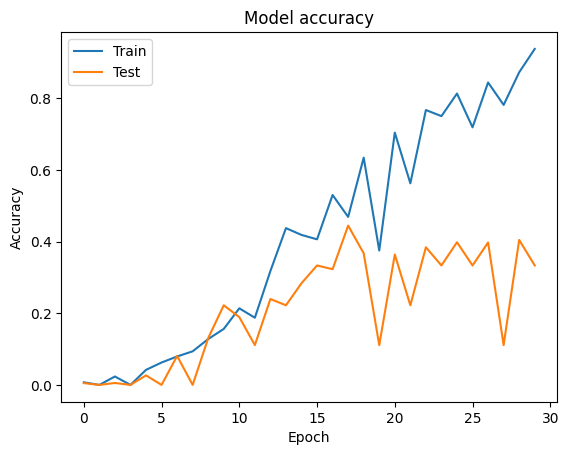

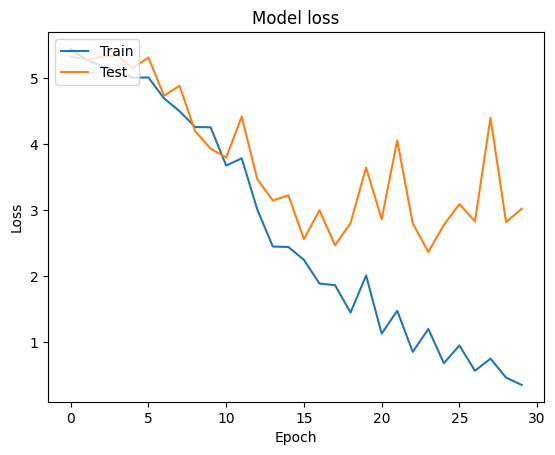

In [ ]:
# Trend Analysis
# Plotting the model accuracies vs epochs and the model losses vs epochs
import matplotlib.pyplot as plt

# Plot training & validation accuracy values
plt.plot(history_Resnet.history['accuracy'])
plt.plot(history_Resnet.history['val_accuracy'])
plt.title('Model accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.plot(history_Resnet.history['loss'])
plt.plot(history_Resnet.history['val_loss'])
plt.title('Model loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

## 2b. ResNet50 Model - With Upsampled Data

In [ ]:
# Loading the Resnet50 model into the notebook # Adding custom layers to the replace the fully connected layers to match the number of classes
# Running the final model
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam
import tensorflow as tf

# Loading the base model with pre-trained weights
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(128, 128, 3))

# Adding custom layers on top of the base model
x = base_model.output
x = Flatten()(x)
x = Dense(512, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(train_generator_upsampled.num_classes, activation='softmax')(x)


model_ResnetUpsampled = tf.keras.Model(inputs=base_model.input, outputs=predictions)

# Compiling the model
model_ResnetUpsampled.compile(optimizer=Adam(learning_rate=1e-4),
              loss='categorical_crossentropy',  # or 'sparse_categorical_crossentropy' depending on your labels
              metrics=['accuracy'])



In [ ]:
# Training the model
history_ResnetUpsampling = model_ResnetUpsampled.fit(
    train_generator_upsampled,
    validation_data=test_generator_upsampled,
    epochs=30,
    steps_per_epoch=train_generator_upsampled.samples // train_generator_upsampled.batch_size,
    validation_steps=test_generator_upsampled.samples // test_generator_upsampled.batch_size
)

Epoch 1/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 1063s 3s/step - accuracy: 0.0054 - loss: 5.6696 - val_accuracy: 0.0054 - val_loss: 5.3108
Epoch 2/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - accuracy: 0.0000e+00 - loss: 5.2854 - val_accuracy: 0.0000e+00 - val_loss: 5.3495
Epoch 3/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 2376s 6s/step - accuracy: 0.0121 - loss: 5.2774 - val_accuracy: 0.0092 - val_loss: 5.2934
Epoch 4/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 3s 675us/step - accuracy: 0.0312 - loss: 5.2164 - val_accuracy: 0.0000e+00 - val_loss: 5.2232
Epoch 5/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 2662s 6s/step - accuracy: 0.0150 - loss: 5.2518 - val_accuracy: 0.0183 - val_loss: 5.2056
Epoch 6/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 2s 379us/step - accuracy: 0.0000e+00 - loss: 5.3374 - val_accuracy: 0.0000e+00 - val_loss: 5.3574
Epoch 7/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 2042s 5s/step - accuracy: 0.0210 - loss: 5.1990 - val_accuracy: 0.0187 - val_loss: 5.2886
Epoch 8/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 3s 493us/step - accuracy: 0.0625

2024-08-29 03:40:38.034135: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


In [ ]:
# Evaluating the model on the test data
test_loss, test_acc = model_ResnetUpsampled.evaluate(test_generator_upsampled)
print(f"Test accuracy: {test_acc * 100:.2f}%")

252/252 ━━━━━━━━━━━━━━━━━━━━ 78s 309ms/step - accuracy: 0.3061 - loss: 2.9699
Test accuracy: 31.15%


In [ ]:
train_loss, train_acc = model_ResnetUpsampled.evaluate(train_generator_upsampled)
print(f"Train accuracy: {train_acc * 100:.2f}%")

417/417 ━━━━━━━━━━━━━━━━━━━━ 127s 304ms/step - accuracy: 0.4482 - loss: 2.3088
Train accuracy: 45.57%


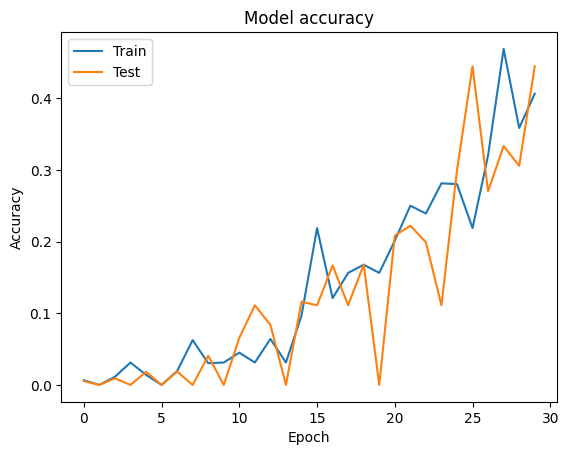

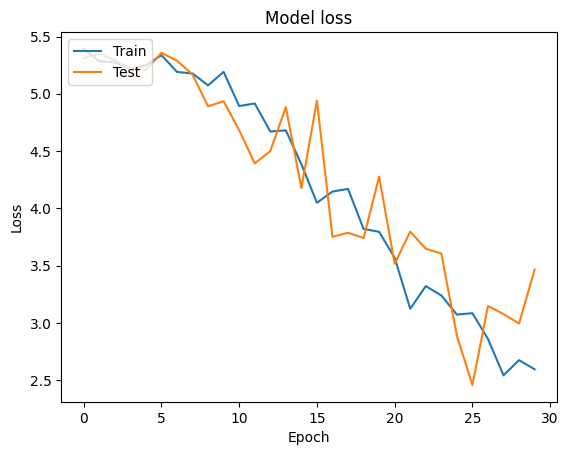

In [ ]:
# Trend Analysis
# Plotting the model accuracies vs epochs and the model losses vs epochs
import matplotlib.pyplot as plt

# Plot training & validation accuracy values
plt.plot(history_ResnetUpsampling.history['accuracy'])
plt.plot(history_ResnetUpsampling.history['val_accuracy'])
plt.title('Model accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.plot(history_ResnetUpsampling.history['loss'])
plt.plot(history_ResnetUpsampling.history['val_loss'])
plt.title('Model loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

**Results:**<br>
With Imbalanced data:<br>
Train Accuracy: 97% <br>
Test Accuracy: 41% <br>

With Balanced data:<br>
Train Accuracy: 44% <br>
Test Accuracy: 30% <br>

## 3. EfficientNet Model - With Imbalanced Data

In [ ]:
# Loading the EfficientNet model into the notebook # Adding custom layers to the replace the fully connected layers to match the number of classes
# Running the final model
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.layers import Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam
import tensorflow as tf

# Define input shape and number of classes
input_shape = (128, 128, 3)  # Adjust according to your data
num_classes = train_generator.num_classes

# Loading the EfficientNetB0 base model with pre-trained weights
base_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=input_shape)

# Adding custom layers on top of the base model
x = base_model.output
x = Flatten()(x)
x = Dense(512, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(num_classes, activation='softmax')(x)


model = tf.keras.Model(inputs=base_model.input, outputs=predictions)

# Compiling the model
model.compile(
    optimizer=Adam(learning_rate=1e-4),
    loss='categorical_crossentropy',  # or 'sparse_categorical_crossentropy' if labels are integers
    metrics=['accuracy']
)

# Printing the model summary
model.summary()


Model: "functional_15"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_10      │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_4         │ (None, 128, 128,  │          0 │ input_layer_10[0… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ normalization_2     │ (None, 128, 128,  │          7 │ rescaling_4[0][0] │
│ (Normalization)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_5         │ (None, 128, 128,  │          0 │ normalization_2[… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv_pad       │ (None, 129, 129,  │          0 │ rescaling_5[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, 64, 64,    │        864 │ stem_conv_pad[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, 64, 64,    │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, 64, 64,    │          0 │ stem_bn[0][0]     │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_dwconv      │ (None, 64, 64,    │        288 │ stem_activation[… │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_bn          │ (None, 64, 64,    │        128 │ block1a_dwconv[0… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_activation  │ (None, 64, 64,    │          0 │ block1a_bn[0][0]  │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_squeeze  │ (None, 32)        │          0 │ block1a_activati… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reshape  │ (None, 1, 1, 32)  │          0 │ block1a_se_squee… │
│ (Reshape)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reduce   │ (None, 1, 1, 8)   │        264 │ block1a_se_resha… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_expand   │ (None, 1, 1, 32)  │        288 │ block1a_se_reduc… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_excite   │ (None, 64, 64,    │          0 │ block1a_activati… │
│ (Multiply)          │ 32)               │            │ block1a_se_expan… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, 64, 64,    │        512 │ block1a_se_excit

 Total params: 14,636,391 (55.83 MB)

 Trainable params: 14,594,368 (55.67 MB)

 Non-trainable params: 42,023 (164.16 KB)

In [ ]:
#Compiling the model with an appropriate optimizer, loss function, and metrics:
model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

In [ ]:
# Training the model using the data generators
history_googlenet = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    epochs=30,
    validation_data=test_generator,
    validation_steps=test_generator.samples // test_generator.batch_size
)


Epoch 1/30
254/254 ━━━━━━━━━━━━━━━━━━━━ 524s 2s/step - accuracy: 0.0076 - loss: 5.6222 - val_accuracy: 0.0056 - val_loss: 5.4672
Epoch 2/30
254/254 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.0000e+00 - loss: 2.6452 - val_accuracy: 0.0000e+00 - val_loss: 2.6871
Epoch 3/30
254/254 ━━━━━━━━━━━━━━━━━━━━ 474s 2s/step - accuracy: 0.0190 - loss: 5.2078 - val_accuracy: 0.0054 - val_loss: 5.2763
Epoch 4/30
254/254 ━━━━━━━━━━━━━━━━━━━━ 2s 904us/step - accuracy: 0.0000e+00 - loss: 2.7082 - val_accuracy: 0.0000e+00 - val_loss: 2.6394
Epoch 5/30
254/254 ━━━━━━━━━━━━━━━━━━━━ 472s 2s/step - accuracy: 0.0243 - loss: 5.1191 - val_accuracy: 0.0235 - val_loss: 5.0531
Epoch 6/30
254/254 ━━━━━━━━━━━━━━━━━━━━ 2s 798us/step - accuracy: 0.1250 - loss: 2.5143 - val_accuracy: 0.1111 - val_loss: 2.1576
Epoch 7/30
254/254 ━━━━━━━━━━━━━━━━━━━━ 466s 2s/step - accuracy: 0.0225 - loss: 5.0428 - val_accuracy: 0.0376 - val_loss: 4.9390
Epoch 8/30
254/254 ━━━━━━━━━━━━━━━━━━━━ 2s 882us/step - accuracy: 0.0312 - loss:

In [ ]:
# Evaluate on the test set
test_loss, test_acc = model.evaluate(test_generator, steps=test_generator.samples // test_generator.batch_size)
print(f"Test accuracy: {test_acc:.2f}")

# Evaluate on the training set
train_loss, train_acc = model.evaluate(train_generator, steps=train_generator.samples // train_generator.batch_size)
print(f"Train accuracy: {train_acc:.2f}")

251/251 ━━━━━━━━━━━━━━━━━━━━ 111s 443ms/step - accuracy: 0.0593 - loss: 4.2840
Test accuracy: 0.06
254/254 ━━━━━━━━━━━━━━━━━━━━ 112s 440ms/step - accuracy: 0.0601 - loss: 4.2233
Train accuracy: 0.06


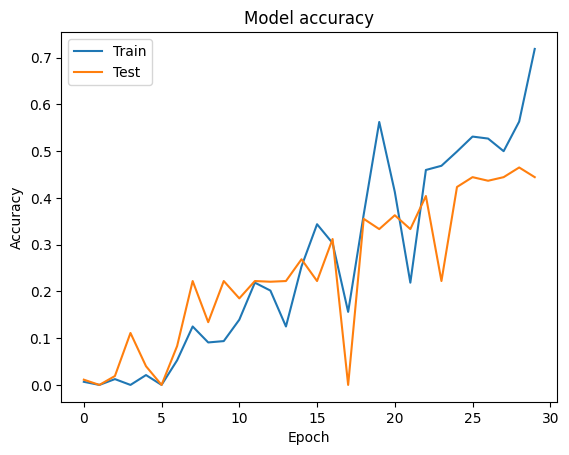

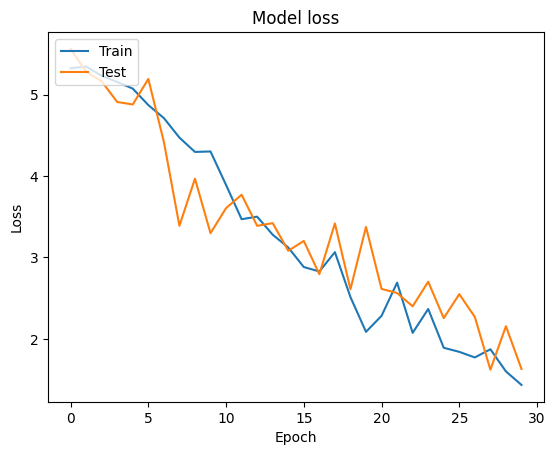

In [ ]:
# Trend Analysis
# Plotting the model accuracies vs epochs and the model losses vs epochs
import matplotlib.pyplot as plt

# Plot training & validation accuracy values
plt.plot(history_googlenet .history['accuracy'])
plt.plot(history_googlenet .history['val_accuracy'])
plt.title('Model accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.plot(history_googlenet .history['loss'])
plt.plot(history_googlenet .history['val_loss'])
plt.title('Model loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()


**Results:**<br>
Train Accuracy: 6%<br>
Test Accuracy: 6%<br>

## 4a. GoogleNet Model - With Imbalanced Data

In [ ]:
# Preparing the train and test data by supplying them to a datagenerator
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_datagen1 = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest',
    brightness_range=[0.8, 1.2]  # Example of additional augmentation
)

train_generator1 = train_datagen1.flow_from_directory(
    train_images_path,
    target_size=(128, 128),
    batch_size=32,
    class_mode='categorical'
)

test_datagen1 = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest',
    brightness_range=[0.8, 1.2]  # Example of additional augmentation
)

test_generator1 = test_datagen1.flow_from_directory(
    test_images_path,
    target_size=(128, 128),
    batch_size=32,
    class_mode='categorical'
)

Found 8144 images belonging to 196 classes.
Found 8041 images belonging to 196 classes.


In [ ]:
# Loading the InceptionV3 model into the notebook # Adding custom layers to the replace the fully connected layers to match the number of classes
# Running the final model
import tensorflow as tf
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout, Flatten
from tensorflow.keras.models import Model
from tensorflow.keras.applications import InceptionV3  # InceptionV3 is a successor to GoogLeNet
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

# Reshaping the images to (128,128)
input_shape = (128, 128, 3)
num_classes = 196

# Loading the Pre-Trained GoogLeNet Model (InceptionV3)
base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=input_shape)

# Customizing the Model
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(num_classes, activation='softmax')(x)

# Combining the base model with custom layers
model_googlenet = Model(inputs=base_model.input, outputs=predictions)

# Freezing Base Model Layers
for layer in base_model.layers[-30:]:
    layer.trainable = True

# Compiling the Model
model_googlenet.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
history_googlenet = model_googlenet.fit(
    train_generator1,
    steps_per_epoch=train_generator1.samples // train_generator1.batch_size,
    epochs=30,
    validation_data=test_generator1,
    validation_steps=test_generator1.samples // test_generator1.batch_size,
)

Epoch 1/30
254/254 ━━━━━━━━━━━━━━━━━━━━ 388s 1s/step - accuracy: 0.0057 - loss: 5.3627 - val_accuracy: 0.0110 - val_loss: 5.2616
Epoch 2/30
254/254 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.0000e+00 - loss: 5.2000 - val_accuracy: 0.0000e+00 - val_loss: 5.2611
Epoch 3/30
254/254 ━━━━━━━━━━━━━━━━━━━━ 4261s 17s/step - accuracy: 0.0109 - loss: 5.2694 - val_accuracy: 0.0171 - val_loss: 5.2259
Epoch 4/30
254/254 ━━━━━━━━━━━━━━━━━━━━ 1s 368us/step - accuracy: 0.0000e+00 - loss: 5.2477 - val_accuracy: 0.0000e+00 - val_loss: 4.6764
Epoch 5/30
254/254 ━━━━━━━━━━━━━━━━━━━━ 513s 2s/step - accuracy: 0.0213 - loss: 5.1456 - val_accuracy: 0.0446 - val_loss: 5.5305
Epoch 6/30
254/254 ━━━━━━━━━━━━━━━━━━━━ 2s 904us/step - accuracy: 0.0312 - loss: 4.9679 - val_accuracy: 0.1111 - val_loss: 6.8155
Epoch 7/30
254/254 ━━━━━━━━━━━━━━━━━━━━ 2580s 10s/step - accuracy: 0.0490 - loss: 4.8382 - val_accuracy: 0.0847 - val_loss: 4.4049
Epoch 8/30
254/254 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.1875 - los

2024-08-29 06:19:29.987259: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:136: Filling up shuffle buffer (this may take a while): 4 of 8
2024-08-29 06:19:32.323710: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


254/254 ━━━━━━━━━━━━━━━━━━━━ 2125s 4s/step - accuracy: 0.0850 - loss: 4.3693 - val_accuracy: 0.1367 - val_loss: 4.1496
Epoch 10/30
254/254 ━━━━━━━━━━━━━━━━━━━━ 1s 643us/step - accuracy: 0.1250 - loss: 3.9483 - val_accuracy: 0.0000e+00 - val_loss: 4.3615
Epoch 11/30
254/254 ━━━━━━━━━━━━━━━━━━━━ 398s 2s/step - accuracy: 0.1321 - loss: 3.9432 - val_accuracy: 0.1815 - val_loss: 3.6985
Epoch 12/30
254/254 ━━━━━━━━━━━━━━━━━━━━ 2s 703us/step - accuracy: 0.2188 - loss: 3.5461 - val_accuracy: 0.2222 - val_loss: 4.0419
Epoch 13/30
254/254 ━━━━━━━━━━━━━━━━━━━━ 385s 2s/step - accuracy: 0.1899 - loss: 3.5045 - val_accuracy: 0.2156 - val_loss: 3.5174
Epoch 14/30
254/254 ━━━━━━━━━━━━━━━━━━━━ 1s 540us/step - accuracy: 0.2500 - loss: 3.3545 - val_accuracy: 0.2222 - val_loss: 2.6709
Epoch 15/30
254/254 ━━━━━━━━━━━━━━━━━━━━ 437s 2s/step - accuracy: 0.2497 - loss: 3.1265 - val_accuracy: 0.2622 - val_loss: 3.0875
Epoch 16/30
254/254 ━━━━━━━━━━━━━━━━━━━━ 2s 673us/step - accuracy: 0.3125 - loss: 2.8665 - val

In [ ]:
# Evaluating the Model
test_loss, test_acc = model_googlenet.evaluate(test_generator1, verbose=1)
print(f"Test accuracy: {test_acc * 100:.2f}%")


252/252 ━━━━━━━━━━━━━━━━━━━━ 43s 170ms/step - accuracy: 0.4645 - loss: 2.1853
Test accuracy: 47.30%


In [ ]:
train_loss, train_acc = model_googlenet.evaluate(train_generator1)
print(f"Train accuracy: {train_acc * 100:.2f}%")

255/255 ━━━━━━━━━━━━━━━━━━━━ 45s 177ms/step - accuracy: 0.7058 - loss: 1.0642
Train accuracy: 70.65%


In [ ]:
# Trend Analysis
# Plotting the model accuracies vs epochs and the model losses vs epochs
import matplotlib.pyplot as plt

# Plot training & validation accuracy values
plt.plot(history_googlenet .history['accuracy'])
plt.plot(history_googlenet .history['val_accuracy'])
plt.title('Model accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.plot(history_googlenet .history['loss'])
plt.plot(history_googlenet .history['val_loss'])
plt.title('Model loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

## 4b. GoogleNet Model - With Upsampled Data

In [ ]:
train_images_upsampled_path = "/Users/sathish/Documents/Machine_Learning/CarDetectionProject1/Car_Images/car_images_upsampled"
test_images_path_dup = "/Users/sathish/Documents/Machine_Learning/CarDetectionProject1/Car_Images/Test_Images"

In [ ]:
# Preparing the train data by sending to a data generator
from tensorflow.keras.preprocessing.image import ImageDataGenerator
num_classes = 196

# Prepare the data using ImageDataGenerator
train_datagen_upsampled1= ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest',
    brightness_range=[0.8, 1.2]  # Example of additional augmentation
)

# Prepare training and validation generators
train_generator_upsampled1 = train_datagen_upsampled1.flow_from_directory(
    directory=train_images_upsampled_path,
    target_size=(128, 128),
    batch_size=32,
    class_mode='categorical',
    subset='training'
)

test_datagen_upsampled1= ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest',
    brightness_range=[0.8, 1.2]  # Example of additional augmentation
)


test_generator_upsampled1 = test_datagen_upsampled1.flow_from_directory(
    test_images_path_dup,
    target_size=(128, 128),
    batch_size=32,
    class_mode='categorical'
)


Found 13317 images belonging to 196 classes.
Found 8041 images belonging to 196 classes.


In [ ]:
# Loading the InceptionV3 model into the notebook # Adding custom layers to replace the fully connected layers to match the number of classes
# Running the final model
import tensorflow as tf
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout, Flatten
from tensorflow.keras.models import Model
from tensorflow.keras.applications import InceptionV3  # InceptionV3 is a successor to GoogLeNet
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

# Resizing the input shape to (128,128)
input_shape = (128, 128, 3)
num_classes = 196

# Loading the Pre-Trained GoogLeNet Model (InceptionV3)
base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=input_shape)

# Customizing the Model
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(num_classes, activation='softmax')(x)

model_googlenetUpsampled = Model(inputs=base_model.input, outputs=predictions)

# Freezing Base Model Layers
for layer in base_model.layers[-30:]:
    layer.trainable = True

# Compiling the Model
model_googlenetUpsampled.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
history_googlenetUpsampled = model_googlenetUpsampled.fit(
    train_generator_upsampled1,
    validation_data=test_generator_upsampled1,
    epochs=30,
    steps_per_epoch=train_generator_upsampled1.samples // train_generator_upsampled1.batch_size,
    validation_steps=test_generator_upsampled1.samples // test_generator_upsampled1.batch_size
)

Epoch 1/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 533s 1s/step - accuracy: 0.0064 - loss: 5.3469 - val_accuracy: 0.0092 - val_loss: 5.3065
Epoch 2/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 2s 947us/step - accuracy: 0.0000e+00 - loss: 5.3109 - val_accuracy: 0.0000e+00 - val_loss: 5.2813
Epoch 3/30


2024-09-02 10:18:49.236959: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


416/416 ━━━━━━━━━━━━━━━━━━━━ 2302s 6s/step - accuracy: 0.0089 - loss: 5.2576 - val_accuracy: 0.0327 - val_loss: 5.0253
Epoch 4/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 1s 360us/step - accuracy: 0.0625 - loss: 4.9021 - val_accuracy: 0.0000e+00 - val_loss: 5.0823
Epoch 5/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 502s 1s/step - accuracy: 0.0370 - loss: 4.8961 - val_accuracy: 0.0754 - val_loss: 4.3981
Epoch 6/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 1s 431us/step - accuracy: 0.0625 - loss: 4.9792 - val_accuracy: 0.0000e+00 - val_loss: 4.7822
Epoch 7/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 688s 2s/step - accuracy: 0.0861 - loss: 4.3797 - val_accuracy: 0.1484 - val_loss: 3.8174
Epoch 8/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 2s 437us/step - accuracy: 0.0625 - loss: 4.2108 - val_accuracy: 0.0000e+00 - val_loss: 3.6526
Epoch 9/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 788s 2s/step - accuracy: 0.1499 - loss: 3.8447 - val_accuracy: 0.2047 - val_loss: 3.4347
Epoch 10/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 2s 541us/step - accuracy: 0.1875 - loss: 3.3953 - v

In [ ]:
# Step 7: Evaluate the Model
test_loss, test_acc = model_googlenetUpsampled.evaluate(test_generator_upsampled1, verbose=1)
print(f"Test accuracy: {test_acc * 100:.2f}%")

252/252 ━━━━━━━━━━━━━━━━━━━━ 43s 170ms/step - accuracy: 0.5246 - loss: 1.9307
Test accuracy: 52.66%


In [ ]:
train_loss, train_acc = model_googlenetUpsampled.evaluate(train_generator_upsampled1)
print(f"Train accuracy: {train_acc * 100:.2f}%")

417/417 ━━━━━━━━━━━━━━━━━━━━ 73s 175ms/step - accuracy: 0.7567 - loss: 0.8742
Train accuracy: 76.31%


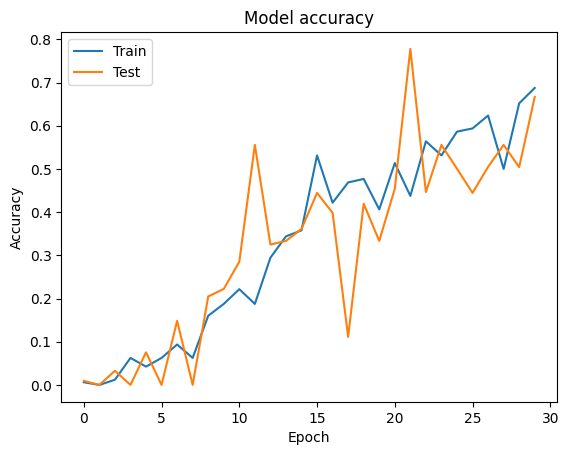

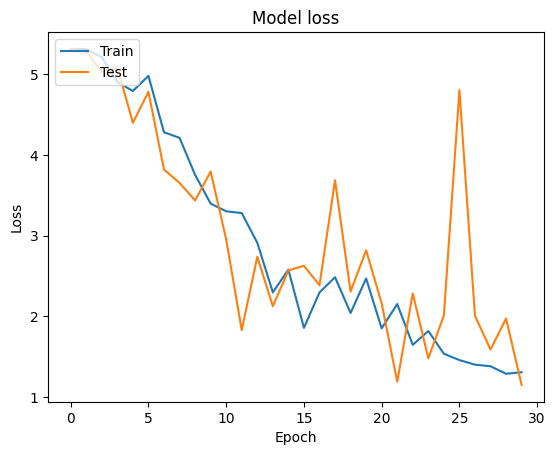

In [ ]:
# Trend Analysis
# Plotting the model accuracies vs epochs and the model losses vs epochs
import matplotlib.pyplot as plt

# Plot training & validation accuracy values
plt.plot(history_googlenetUpsampled.history['accuracy'])
plt.plot(history_googlenetUpsampled.history['val_accuracy'])
plt.title('Model accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.plot(history_googlenetUpsampled.history['loss'])
plt.plot(history_googlenetUpsampled.history['val_loss'])
plt.title('Model loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

**Results:**<br>
With Imbalanced Data:<br>
Train Accuracy: 71%<br>
Test Accuracy: 46%<br>

With Upsampled Data:<br>
Train Accuracy: 76%<br>
Test Accuracy: 52%<br>

## 5a. VGG16 Model - With Imbalanced Data

In [ ]:
# Loading the VGG16 model into the notebook # Adding custom layers to replace the fully connected layers to match the number of classes
# Running the final model

import tensorflow as tf
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout, Flatten
from tensorflow.keras.models import Model
from tensorflow.keras.applications import VGG16
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
import math

# Setting the image size to (128,128)
input_shape = (128, 128, 3)
num_classes = 196

# Loading the Pre-Trained VGG16 Model
base_model = VGG16(weights='imagenet', include_top=False, input_shape=input_shape)

# Customizing the Model
x = base_model.output
x = Flatten()(x)  # Flatten the output layer to 1D tensor
x = Dense(1024, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(num_classes, activation='softmax')(x)

model_VGG = Model(inputs=base_model.input, outputs=predictions)

# Freezing the Base Layers
for layer in base_model.layers:
    layer.trainable = False

# Compiling the Model
model_VGG.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
history_VGG = model_VGG.fit(
    train_generator1,
    steps_per_epoch=train_generator1.samples // train_generator1.batch_size,
    validation_data=test_generator1,
    validation_steps=test_generator1.samples // test_generator1.batch_size,
    epochs=20,
   )


Epoch 1/20
254/254 ━━━━━━━━━━━━━━━━━━━━ 2355s 9s/step - accuracy: 0.0072 - loss: 5.4728 - val_accuracy: 0.0122 - val_loss: 5.2480
Epoch 2/20
254/254 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.0000e+00 - loss: 5.2030 - val_accuracy: 0.0000e+00 - val_loss: 5.2618
Epoch 3/20
254/254 ━━━━━━━━━━━━━━━━━━━━ 3712s 15s/step - accuracy: 0.0102 - loss: 5.2541 - val_accuracy: 0.0190 - val_loss: 5.2124
Epoch 4/20
254/254 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.0000e+00 - loss: 5.2040 - val_accuracy: 0.1111 - val_loss: 5.2745
Epoch 5/20


2024-09-02 17:22:02.611062: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


254/254 ━━━━━━━━━━━━━━━━━━━━ 1730s 7s/step - accuracy: 0.0145 - loss: 5.2051 - val_accuracy: 0.0251 - val_loss: 5.1478
Epoch 6/20
254/254 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.0000e+00 - loss: 5.2373 - val_accuracy: 0.0000e+00 - val_loss: 5.2776
Epoch 7/20
254/254 ━━━━━━━━━━━━━━━━━━━━ 843s 3s/step - accuracy: 0.0185 - loss: 5.1359 - val_accuracy: 0.0322 - val_loss: 5.0709
Epoch 8/20
254/254 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.0000e+00 - loss: 5.2024 - val_accuracy: 0.1111 - val_loss: 4.8829
Epoch 9/20
254/254 ━━━━━━━━━━━━━━━━━━━━ 2912s 11s/step - accuracy: 0.0267 - loss: 5.0465 - val_accuracy: 0.0377 - val_loss: 4.9769
Epoch 10/20
254/254 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.0625 - loss: 4.8795 - val_accuracy: 0.0000e+00 - val_loss: 5.0684
Epoch 11/20
254/254 ━━━━━━━━━━━━━━━━━━━━ 1844s 7s/step - accuracy: 0.0349 - loss: 4.9658 - val_accuracy: 0.0417 - val_loss: 4.9032
Epoch 12/20
254/254 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.0312 - loss: 4.9223 - 

In [ ]:
# Evaluation of model on test data
test_loss, test_acc = model_VGG.evaluate(test_generator1, verbose=1)
print(f"Test accuracy: {test_acc * 100:.2f}%")

252/252 ━━━━━━━━━━━━━━━━━━━━ 452s 2s/step - accuracy: 0.0773 - loss: 4.6140
Test accuracy: 7.80%


In [ ]:
train_loss, train_acc = model_VGG.evaluate(train_generator1)
print(f"Train accuracy: {train_acc * 100:.2f}%")

255/255 ━━━━━━━━━━━━━━━━━━━━ 283s 1s/step - accuracy: 0.1228 - loss: 4.3617
Train accuracy: 12.89%


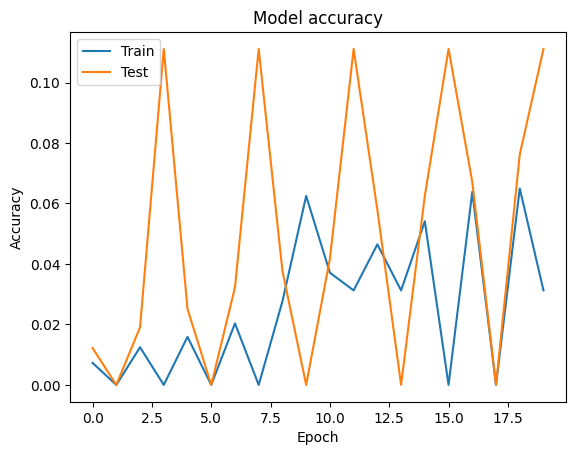

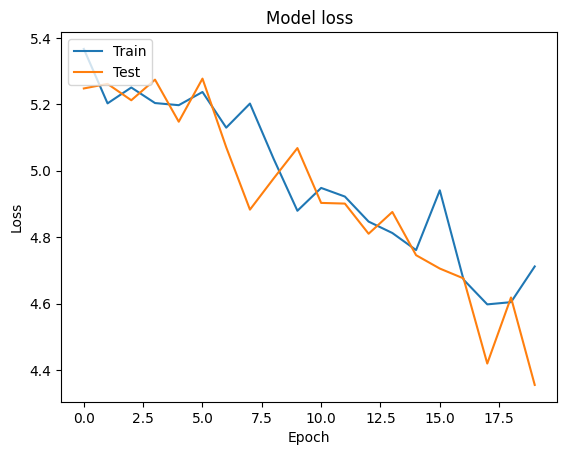

In [ ]:
# Trend Analysis
# Plotting the model accuracies vs epochs and the model losses vs epochs
import matplotlib.pyplot as plt

# Plot training & validation accuracy values
plt.plot(history_VGG.history['accuracy'])
plt.plot(history_VGG.history['val_accuracy'])
plt.title('Model accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.plot(history_VGG.history['loss'])
plt.plot(history_VGG.history['val_loss'])
plt.title('Model loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

## 5b. VGG16 Model - With Upsampled Data

In [ ]:
# Loading the VGG16 model into the notebook # Adding custom layers to replace the fully connected layers to match the number of classes
# Running the final model
import tensorflow as tf
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout, Flatten
from tensorflow.keras.models import Model
from tensorflow.keras.applications import VGG16
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
import math

# Setting the image size to (128,128)
input_shape = (128, 128, 3)
num_classes = 196

# Loading the Pre-Trained VGG16 Model
base_model = VGG16(weights='imagenet', include_top=False, input_shape=input_shape)

# Customizing the Model
x = base_model.output
x = Flatten()(x)  # Flatten the output layer to 1D tensor
x = Dense(1024, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(num_classes, activation='softmax')(x)

# Combining base model with custom layers
model_VGGUpsampling = Model(inputs=base_model.input, outputs=predictions)

# Freezing Base Model Layers
for layer in base_model.layers:
    layer.trainable = False

# Compiling the Model
model_VGGUpsampling.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
history_VGGUpsampling = model_VGGUpsampling.fit(
train_generator_upsampled1,
    validation_data=test_generator_upsampled1,
    epochs=20,
    steps_per_epoch=train_generator_upsampled1.samples // train_generator_upsampled1.batch_size,
    validation_steps=test_generator_upsampled1.samples // test_generator_upsampled1.batch_size
   )

Epoch 1/20
416/416 ━━━━━━━━━━━━━━━━━━━━ 2087s 5s/step - accuracy: 0.0068 - loss: 5.4335 - val_accuracy: 0.0090 - val_loss: 5.2518
Epoch 2/20
  1/416 ━━━━━━━━━━━━━━━━━━━━ 6:16 906ms/step - accuracy: 0.0000e+00 - loss: 5.3521

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


416/416 ━━━━━━━━━━━━━━━━━━━━ 1s 788us/step - accuracy: 0.0000e+00 - loss: 5.3521 - val_accuracy: 0.0000e+00 - val_loss: 5.2554
Epoch 3/20
416/416 ━━━━━━━━━━━━━━━━━━━━ 2161s 5s/step - accuracy: 0.0105 - loss: 5.2515 - val_accuracy: 0.0210 - val_loss: 5.1879
Epoch 4/20
416/416 ━━━━━━━━━━━━━━━━━━━━ 1s 760us/step - accuracy: 0.0312 - loss: 5.2202 - val_accuracy: 0.0000e+00 - val_loss: 5.2513
Epoch 5/20
416/416 ━━━━━━━━━━━━━━━━━━━━ 4175s 10s/step - accuracy: 0.0192 - loss: 5.1784 - val_accuracy: 0.0268 - val_loss: 5.0882
Epoch 6/20
416/416 ━━━━━━━━━━━━━━━━━━━━ 1s 664us/step - accuracy: 0.0000e+00 - loss: 5.0967 - val_accuracy: 0.0000e+00 - val_loss: 5.0137
Epoch 7/20
416/416 ━━━━━━━━━━━━━━━━━━━━ 2237s 5s/step - accuracy: 0.0240 - loss: 5.0717 - val_accuracy: 0.0401 - val_loss: 4.9631
Epoch 8/20
416/416 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.0000e+00 - loss: 5.0507 - val_accuracy: 0.0000e+00 - val_loss: 5.0268
Epoch 9/20
416/416 ━━━━━━━━━━━━━━━━━━━━ 1254s 3s/step - accuracy: 0.0344 -

In [ ]:
# Evaluation of the Model on test data
test_loss, test_acc = model_VGGUpsampling.evaluate(test_generator_upsampled1, verbose=1)
print(f"Test accuracy: {test_acc * 100:.2f}%")

252/252 ━━━━━━━━━━━━━━━━━━━━ 353s 1s/step - accuracy: 0.0871 - loss: 4.5066
Test accuracy: 8.61%


In [ ]:
train_loss, train_acc = model_VGGUpsampling.evaluate(train_generator_upsampled1)
print(f"Train accuracy: {train_acc * 100:.2f}%")

417/417 ━━━━━━━━━━━━━━━━━━━━ 793s 2s/step - accuracy: 0.1425 - loss: 4.2419
Train accuracy: 14.39%


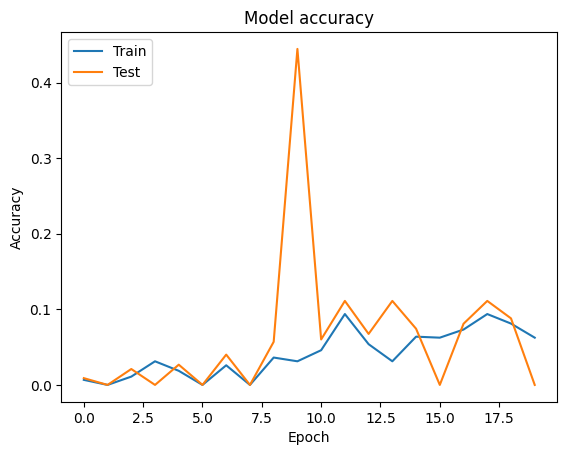

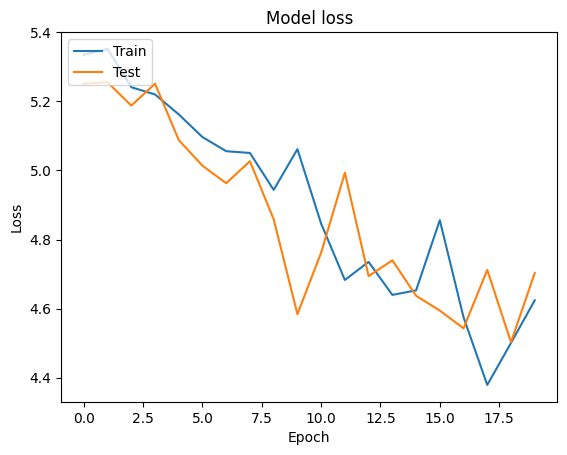

In [ ]:
# Trend Analysis
# Plotting the model accuracies vs epochs and the model losses vs epochs
import matplotlib.pyplot as plt

# Plot training & validation accuracy values
plt.plot(history_VGGUpsampling.history['accuracy'])
plt.plot(history_VGGUpsampling.history['val_accuracy'])
plt.title('Model accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.plot(history_VGGUpsampling.history['loss'])
plt.plot(history_VGGUpsampling.history['val_loss'])
plt.title('Model loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

**Results:**<br>
With Imbalanced Data:<br>
Train Accuracy: 7%<br>
Test Accuracy: 11%<br>

With Upsampled Data:<br>
Train Accuracy: 8%<br>
Test Accuracy: 14%<br>

**Overall Observation**:<br>
Models:<br>
Train Accuracy(%):<br>
1. ResNet without Sampling - 97%<br>               
2. ResNet with upsampling - 46%<br>
3. GoogleNet without upsampling	- 71%<br>
4. GoogleNet with upsampling - 76%<br>
5. VGG without upsampling - 15%<br>
6. VGG with upsampling - 13%<br>

Test Accuracy(%):<br>
1. ResNet without Sampling - 41%<br>
2. ResNet with upsampling - 31%<br>
3. GoogleNet without upsampling	- 48%<br>
4. GoogleNet with upsampling - 53%<br>
5. VGG without upsampling - 8%<br>
6. VGG with upsampling - 9%<br>

Out of all the models, GoogleNet (Inception V3) model performed better since it has the higher test accuracy and also much better 'epoch vs accuracy' and 'epoch vs loss' profiles. Here, the Epoch vs Accuracy for train and validation dataset is increasing across epochs consistently and the Epoch vs Loss for train and validation dataset is decreasing across epochs consistently


# Part 7: R-CNN - Object Detection Models

## Basic R-CNN Model

In [ ]:
import cv2
import matplotlib.pyplot as plt

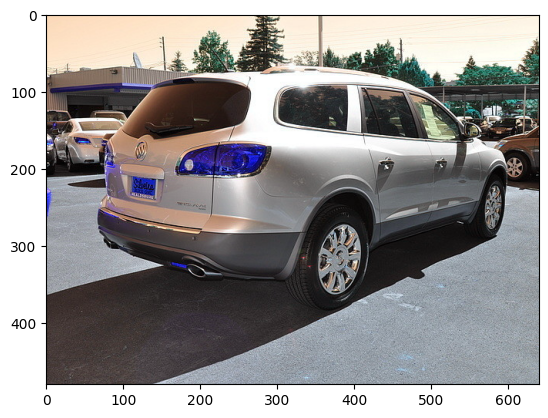

In [ ]:
# Displaying a sample image before sending it to the Selective Search algorithm
sample_image_path = '/content/drive/My Drive/capstone_project/Images/car_images/train_images/Buick Enclave SUV 2012/00417.jpg'
image = cv2.imread(sample_image_path)
plt.imshow(image)

Number of region proposals: 140


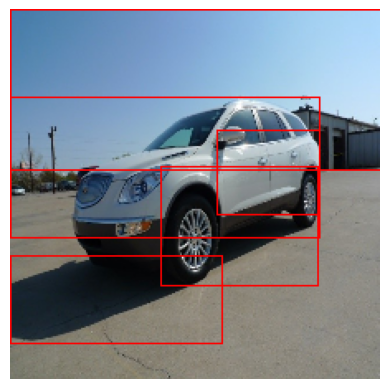

In [ ]:
# Defining a Selective Search function to input the image and return ROIs after applying the filtered condition
import cv2
import matplotlib.pyplot as plt

def selective_search(image, min_size=50):
    if image is None:
        raise ValueError("Image not loaded correctly. Check the file path.")

    # Creating a selective search segmentation object
    ss = cv2.ximgproc.segmentation.createSelectiveSearchSegmentation()
    ss.setBaseImage(image)
    ss.switchToSelectiveSearchFast()
    rects = ss.process()

    # Filter out regions based on the minimum threshold (i.e., width > 50 and height > 50)
    filtered_rects = [rect for rect in rects if rect[2] > min_size and rect[3] > min_size]
    return filtered_rects


# Loading the sample image and resizing it to (224, 224)
sample_image = cv2.imread('/content/drive/My Drive/capstone_project/Images/car_images/train_images/Buick Enclave SUV 2012/00362.jpg')
image_resized = cv2.resize(sample_image, (224, 224))

# Testing Selective Search algorithm on a sample image
rects = selective_search(image_resized, min_size=50)
print("Number of region proposals:", len(rects))

# Visualizing some of the proposed regions
# Convert image to RGB for displaying with matplotlib
sample_image_rgb = cv2.cvtColor(image_resized, cv2.COLOR_BGR2RGB)

for x, y, w, h in rects[:5]:  # Display only the first 5 regions
    cv2.rectangle(sample_image_rgb, (x, y), (x+w, y+h), (255, 0, 0),1)

plt.imshow(sample_image_rgb)
plt.axis('off')  # Hide axis
plt.show()

In [ ]:
# Limiting the training data to first 1000 records
df = train_annotation_v1.iloc[:1000,:].copy()

In [ ]:
# Creating a custom Car Dataset to take images and the bounding box coordinates and convert it to tensors
import os
import numpy as np
import cv2
import torch
from torch.utils.data import Dataset

class CarDataset(Dataset):
    def __init__(self, df, transform=None, target_size=(224, 224)):
        self.df = df
        self.transform = transform
        self.target_size = target_size
        self.missing_files = []

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        image_path = row['image_path']

        if not os.path.exists(image_path):
            print(f"File not found: {image_path}")
            self.missing_files.append(image_path)
            return None, None

        image = cv2.imread(image_path)

        if image is None:
            print(f"Failed to read image: {image_path}")
            self.missing_files.append(image_path)
            return None, None

        original_height, original_width = image.shape[:2]
        image = cv2.resize(image, self.target_size)
        new_height, new_width = self.target_size

        # Initialize default values for bounding boxes
        x1, y1, x2, y2 = 0, 0, 0, 0

        # Check for bounding box values
        if not (pd.isna(row['x_min']) or pd.isna(row['y_min']) or pd.isna(row['x_max']) or pd.isna(row['y_max'])):
            # Scale bounding boxes
            scale_x = new_width / original_width
            scale_y = new_height / original_height

            x1 = row['x_min'] * scale_x
            y1 = row['y_min'] * scale_y
            x2 = row['x_max'] * scale_x
            y2 = row['y_max'] * scale_y

        bboxes = np.array([[x1, y1, x2, y2]], dtype=np.float32)

        if self.transform:
            image = self.transform(image)

        bboxes = torch.as_tensor(bboxes, dtype=torch.float32)
        target = {'boxes': bboxes}

        return image, target

In [ ]:
# Defining a transform function that will resize it to (224, 224) and converting it to tensor object
from torchvision import transforms

transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((224, 224)),
    transforms.ToTensor()
])

dataset = CarDataset(df, transform)

print("Number of samples in dataset:", len(dataset))

# Printing the sample data (5 records) to class 'Dataset'
for i in range(min(5, len(dataset))):
    image, target = dataset[i]
    if image is None or target is None:
        print(f"Sample {i} failed to load or process.")
    else:
        print(f"Sample {i} - Image shape: {image.shape}, Bounding boxes: {target['boxes'].numpy()}")

Number of samples in dataset: 1000
Sample 0 - Image shape: torch.Size([3, 224, 224]), Bounding boxes: [[ 14.56     64.96    212.42667 210.     ]]
Sample 1 - Image shape: torch.Size([3, 224, 224]), Bounding boxes: [[  8.96      38.494816 216.03555  194.79704 ]]
Sample 2 - Image shape: torch.Size([3, 224, 224]), Bounding boxes: [[ 29.75      50.866665 210.35     177.8     ]]
Sample 3 - Image shape: torch.Size([3, 224, 224]), Bounding boxes: [[ 66.24      63.515152 158.29333  177.13132 ]]
Sample 4 - Image shape: torch.Size([3, 224, 224]), Bounding boxes: [[ 21.777779  74.666664 206.88889  205.33333 ]]


In [ ]:
# Splitting the dataset into train and validation sets
train_df, val_df = train_test_split(df, test_size=0.2, random_state=42)
print("Number of training samples:", len(train_df))
print("Number of val samples:", len(val_df))

Number of training samples: 800
Number of val samples: 200


In [ ]:
from torch.utils.data import DataLoader

# Creating the train and test datasets and dataloaders
train_dataset = CarDataset(train_df, transform)
val_dataset = CarDataset(val_df, transform)
train_dataloader = DataLoader(train_dataset, batch_size=1, shuffle=True, collate_fn=lambda x: tuple(zip(*x)))
val_dataloader = DataLoader(val_dataset, batch_size=1, shuffle=False, collate_fn=lambda x: tuple(zip(*x)))

# Checking for the number of records/data in train dataLoader
print("Number of batches in training DataLoader:", len(train_dataloader))

Number of batches in training DataLoader: 800


In [ ]:
# Building a simple CNN models to get feature maps of the image
import torch
import torch.nn as nn
import torch.nn.functional as F

class SimpleCNN(nn.Module):
    def __init__(self, input_size=(224, 224)):
        super(SimpleCNN, self).__init__()
        self.input_size = input_size
        self.features = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=3, stride=1, padding=1),
            nn.ReLU(inplace=True),
            nn.AvgPool2d(kernel_size=2, stride=2),  # 112x112
            nn.Conv2d(16, 32, kernel_size=3, stride=1, padding=1),
            nn.ReLU(inplace=True),
            nn.AvgPool2d(kernel_size=2, stride=2),  # 56x56
            nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(inplace=True),
            nn.AvgPool2d(kernel_size=2, stride=2)   # 28x28
        )

        # Testing the below code to get the flattened size of the final output
        dummy_input = torch.zeros(1, 3, *input_size)
        dummy_output = self.features(dummy_input)
        self.flattened_size = dummy_output.view(-1).size(0)

    def forward(self, x):
        if x.size(2) != self.input_size[0] or x.size(3) != self.input_size[1]:
            x = F.interpolate(x, size=self.input_size, mode='bilinear', align_corners=False)
        x = self.features(x)
        x = x.view(x.size(0), -1)
        return x

# Creating an instance of the model and printing the flattened size
cnn_model = SimpleCNN()
print("Flattened size after conv layers:", cnn_model.flattened_size)

# Example
dummy_images = torch.randn(5, 3, 128, 128)  # A batch of 5 images with size 224x224
flattened_features = cnn_model(dummy_images)
print("Flattened features shape:", flattened_features.shape)

Flattened size after conv layers: 50176
Flattened features shape: torch.Size([5, 50176])


In [ ]:
# Extracting the features from the images, labels and GT bounding boxes and appending it to the features, bbox and labels list
features = []
labels = []
for image, target in train_dataset:
    if image is None or target is None:
        continue  # Skip if the image or target is missing
    with torch.no_grad():
        feature = cnn_model(image.unsqueeze(0)).cpu().numpy().flatten()
    if len(target['boxes']) > 0:
        # Positive samples with bounding boxes
        for bbox in target['boxes']:
            features.append(feature)
            labels.append(1)
    else:
        features.append(feature)
        labels.append(0)

    rects = selective_search(image.numpy().transpose(1, 2, 0))
    for rect in rects[:10]:  # Limit to 10  samples per image
        x, y, w, h = rect
        if w < 50 or h < 50:  # Skip regions that are too small
            continue
        region = image[:, y:y+h, x:x+w]
        region = nn.functional.interpolate(region.unsqueeze(0), size=(128, 128), mode='bilinear', align_corners=False).squeeze(0)
        with torch.no_grad():
            feature = cnn_model(region.unsqueeze(0)).cpu().numpy().flatten()
        features.append(feature)
        labels.append(0)

train_features = np.array(features)
train_labels = np.array(labels)
print("Number of training samples:", len(train_features))
print("Shape of training features:", train_features.shape)
print("Shape of training labels:", train_labels.shape)

Number of training samples: 8800
Shape of training features: (8800, 50176)
Shape of training labels: (8800,)


In [ ]:
# Defining the fully connected layers at the model end to get the bounding box coordinates
class BoundingBoxRegressor(nn.Module):
    def __init__(self, input_size):
        super(BoundingBoxRegressor, self).__init__()
        self.fc = nn.Sequential(
            nn.Linear(input_size, 512),
            nn.ReLU(inplace=True),
            nn.Linear(512, 4)
        )

    def forward(self, x):
        return self.fc(x)

# Initializing the regressor with the correct input size
regressor = BoundingBoxRegressor(cnn_model.flattened_size)
print(regressor)

BoundingBoxRegressor(
  (fc): Sequential(
    (0): Linear(in_features=50176, out_features=512, bias=True)
    (1): ReLU(inplace=True)
    (2): Linear(in_features=512, out_features=4, bias=True)
  )
)


In [ ]:
# Generating the feature maps and bounding box coordinates and appending it to the lists
features = []
bbox_labels = []
for image, target in train_dataset:
    if image is None or target is None:
        continue
    with torch.no_grad():
        feature = cnn_model.features(image.unsqueeze(0)).view(-1).cpu().numpy()
    if len(target['boxes']) > 0:
        for bbox in target['boxes']:
            features.append(feature)
            bbox_labels.append(bbox.numpy())
    else:
        features.append(feature)
        bbox_labels.append(np.array([0, 0, 0, 0]))  # No bounding box

train_features = np.array(features)
train_bbox_labels = np.array(bbox_labels)

# Verify the shapes
print("Train features shape:", train_features.shape)
print("Train bounding box labels shape:", train_bbox_labels.shape)

Train features shape: (800, 50176)
Train bounding box labels shape: (800, 4)


In [ ]:
# Converting the feature maps to torch tensors
train_features = torch.tensor(train_features, dtype=torch.float32)
train_bbox_labels = torch.tensor(train_bbox_labels, dtype=torch.float32)

# Defining the loss function and optimizer
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(regressor.parameters(), lr=0.001)

# Training the model on the data for 50 epochs
num_epochs = 50
for epoch in range(num_epochs):
    regressor.train()
    optimizer.zero_grad()
    outputs = regressor(train_features)
    loss = criterion(outputs, train_bbox_labels)
    loss.backward()
    optimizer.step()
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')

Epoch [1/50], Loss: 21012.5078
Epoch [2/50], Loss: 20479.7559
Epoch [3/50], Loss: 19936.2520
Epoch [4/50], Loss: 19321.1816
Epoch [5/50], Loss: 18642.0430
Epoch [6/50], Loss: 17903.0020
Epoch [7/50], Loss: 17107.8809
Epoch [8/50], Loss: 16261.0127
Epoch [9/50], Loss: 15367.5977
Epoch [10/50], Loss: 14433.9375
Epoch [11/50], Loss: 13467.5342
Epoch [12/50], Loss: 12477.0928
Epoch [13/50], Loss: 11472.1963
Epoch [14/50], Loss: 10462.3643
Epoch [15/50], Loss: 9455.9922
Epoch [16/50], Loss: 8461.0635
Epoch [17/50], Loss: 7487.1099
Epoch [18/50], Loss: 6545.4199
Epoch [19/50], Loss: 5647.8364
Epoch [20/50], Loss: 4805.3696
Epoch [21/50], Loss: 4027.0325
Epoch [22/50], Loss: 3319.5596
Epoch [23/50], Loss: 2688.3606
Epoch [24/50], Loss: 2138.7834
Epoch [25/50], Loss: 1676.3058
Epoch [26/50], Loss: 1305.4285
Epoch [27/50], Loss: 1027.9144
Epoch [28/50], Loss: 841.1505
Epoch [29/50], Loss: 737.5042
Epoch [30/50], Loss: 705.1794
Epoch [31/50], Loss: 729.8342
Epoch [32/50], Loss: 795.8583
Epoch [3

In [ ]:
# Save the trained model
torch.save(regressor.state_dict(), 'bbox_regressor.pth')

In [ ]:
# Load the trained model
regressor.load_state_dict(torch.load('bbox_regressor.pth'))
regressor.eval()

# Evaluate on test dataset
for i in range(5):  # Evaluate first 5 test samples
    image, target = val_dataset[i]
    with torch.no_grad():
        feature = cnn_model.features(image.unsqueeze(0)).view(-1).cpu().numpy()
        feature = torch.tensor(feature, dtype=torch.float32).unsqueeze(0)
        pred_bbox = regressor(feature).cpu().numpy().flatten()
    print(f"Predicted bounding box for sample {i}: {pred_bbox}")
    if len(target['boxes']) > 0:
        true_bbox = target['boxes'][0].numpy()
        print(f"True bounding box: {true_bbox}")

Predicted bounding box for sample 0: [ 16.722927  49.221012 209.30464  191.03192 ]
True bounding box: [ 14.297873  22.084507 224.       214.53522 ]
Predicted bounding box for sample 1: [ 16.37801   48.077442 203.83485  186.17924 ]
True bounding box: [ 14.7      71.4     210.7     181.53334]
Predicted bounding box for sample 2: [ 16.525385  48.64181  206.56898  188.58496 ]
True bounding box: [ 14.35     37.8     220.15    191.33333]
Predicted bounding box for sample 3: [ 17.143879  50.461224 214.10277  195.56955 ]
True bounding box: [  4.226415  44.177776 222.4151   177.33333 ]
Predicted bounding box for sample 4: [ 16.929193  49.71458  211.21382  192.91545 ]
True bounding box: [ 21.328125  61.18062  208.6875   220.21733 ]


<ipython-input-186-492282d60f17>:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  regressor.load_state_dict(torch.load('bbox_regressor.pth'))


In [ ]:
test_df = test_annotation_v1.iloc[:100,:].copy()
test_dataset = CarDataset(test_df, transform)
test_dataloader = DataLoader(test_dataset, batch_size=1, shuffle=False, collate_fn=lambda x: tuple(zip(*x)))

In [ ]:
# Evaluting the model on test dataset
test_features = []
true_bboxes = []
images = []

for image, target in test_dataset:
    if image is None or target is None:
        continue
    with torch.no_grad():
        feature = cnn_model.features(image.unsqueeze(0)).view(-1).cpu().numpy()
    test_features.append(feature)
    true_bboxes.append(target['boxes'][0].numpy() if len(target['boxes']) > 0 else np.array([0, 0, 0, 0]))
    images.append(image)

test_features = torch.tensor(test_features, dtype=torch.float32)

In [ ]:
# Predicting the bounding boxes
with torch.no_grad():
    pred_bboxes = regressor(test_features).cpu().numpy()

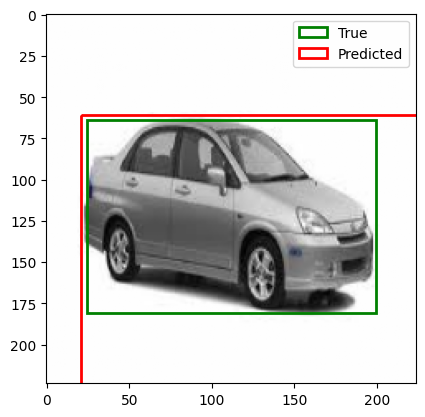

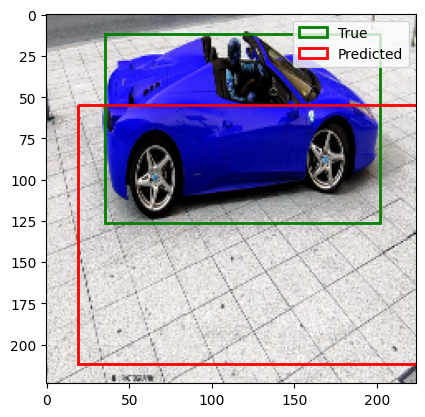

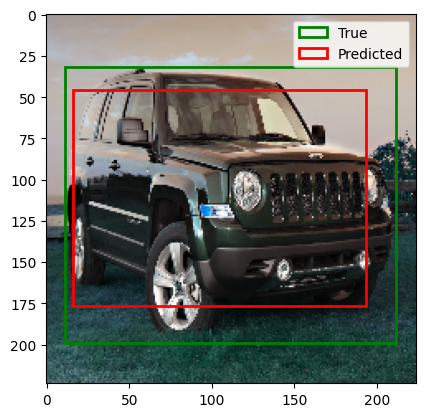

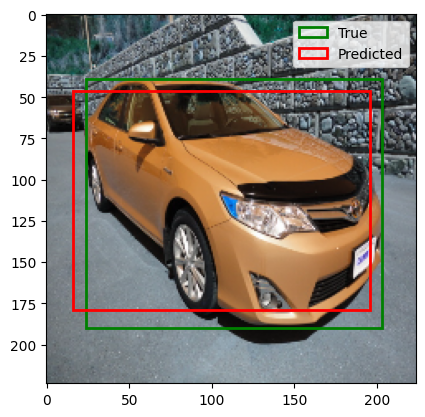

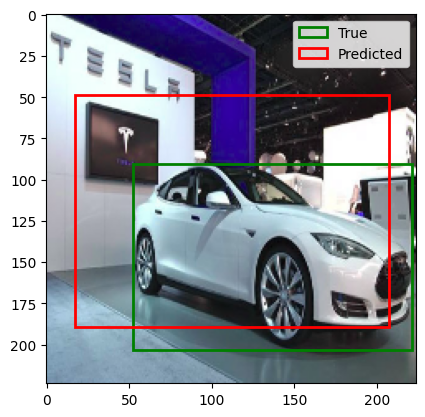

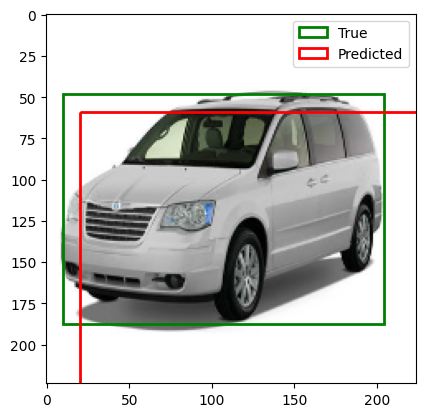

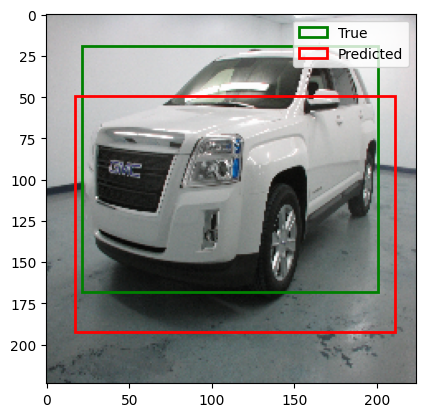

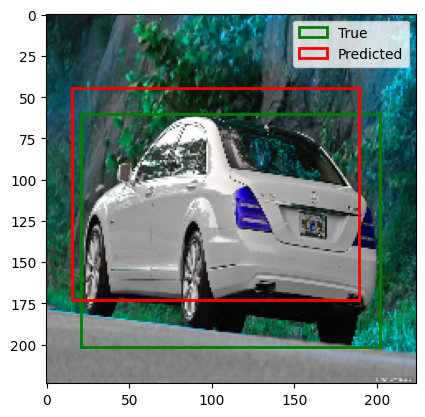

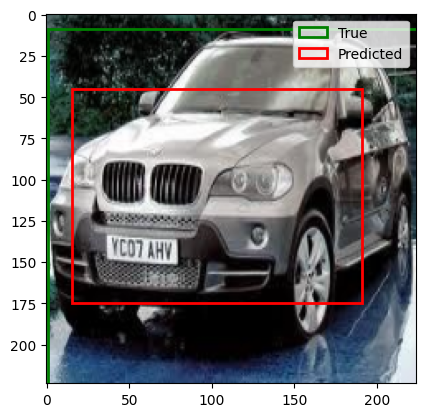

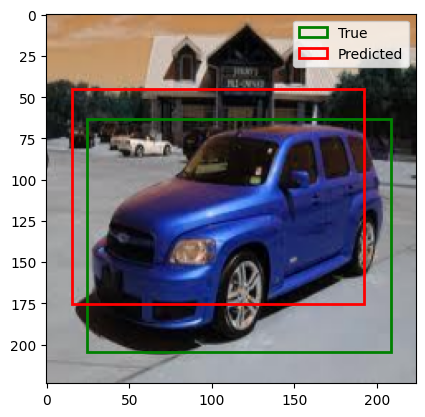

In [ ]:
import matplotlib.pyplot as plt

# Defining a function to plot the bounding boxes
def plot_bounding_boxes(image, true_bbox, pred_bbox):
    image_np = image.permute(1, 2, 0).numpy()
    plt.imshow(image_np)
    # Plot true bounding box
    if not np.array_equal(true_bbox, [0, 0, 0, 0]):
        x1, y1, x2, y2 = true_bbox
        plt.gca().add_patch(plt.Rectangle((x1, y1), x2-x1, y2-y1, edgecolor='green', facecolor='none', linewidth=2, label='True'))
    # Plot predicted bounding box
    if not np.array_equal(pred_bbox, [0, 0, 0, 0]):
        x1, y1, x2, y2 = pred_bbox
        plt.gca().add_patch(plt.Rectangle((x1, y1), x2-x1, y2-y1, edgecolor='red', facecolor='none', linewidth=2, label='Predicted'))
    plt.legend()
    plt.show()

# Plot a few test images with their true and predicted bounding boxes
for i in range(10):  # Plot first 5 test samples
    plot_bounding_boxes(images[i], true_bboxes[i], pred_bboxes[i])


In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Function to calculate IoU
def calculate_iou(true_bbox, pred_bbox):
    x1_true, y1_true, x2_true, y2_true = true_bbox
    x1_pred, y1_pred, x2_pred, y2_pred = pred_bbox

    # Calculate the intersection coordinates
    xi1 = max(x1_true, x1_pred)
    yi1 = max(y1_true, y1_pred)
    xi2 = min(x2_true, x2_pred)
    yi2 = min(y2_true, y2_pred)

    # Calculate area of intersection
    inter_width = max(0, xi2 - xi1)
    inter_height = max(0, yi2 - yi1)
    inter_area = inter_width * inter_height

    # Calculate area of union
    true_area = (x2_true - x1_true) * (y2_true - y1_true)
    pred_area = (x2_pred - x1_pred) * (y2_pred - y1_pred)
    union_area = true_area + pred_area - inter_area

    # IoU calculation
    iou = inter_area / union_area if union_area != 0 else 0
    return iou

In [ ]:
# Function to plot bounding boxes
def plot_bounding_boxes(image, true_bbox, pred_bbox, iou=None):
    image_np = image.permute(1, 2, 0).numpy()
    plt.imshow(image_np)

    # Plot true bounding box
    if not np.array_equal(true_bbox, [0, 0, 0, 0]):
        x1, y1, x2, y2 = true_bbox
        plt.gca().add_patch(plt.Rectangle((x1, y1), x2-x1, y2-y1, edgecolor='green', facecolor='none', linewidth=2, label='True'))

    # Plot predicted bounding box
    if not np.array_equal(pred_bbox, [0, 0, 0, 0]):
        x1, y1, x2, y2 = pred_bbox
        plt.gca().add_patch(plt.Rectangle((x1, y1), x2-x1, y2-y1, edgecolor='red', facecolor='none', linewidth=2, label='Predicted'))

    # Display IoU score
    if iou is not None:
        plt.text(10, 10, f'IoU: {iou:.2f}', color='yellow', fontsize=12, bbox=dict(facecolor='black', alpha=0.5))

    plt.legend()
    plt.show()

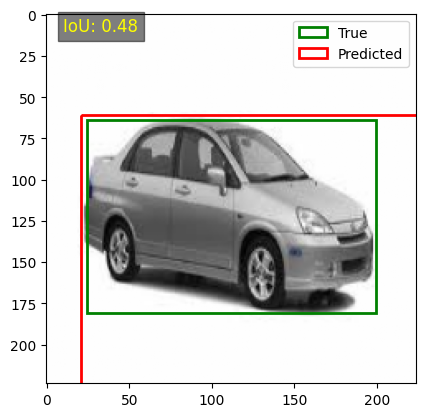

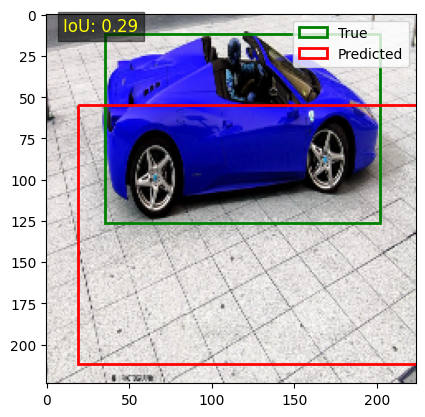

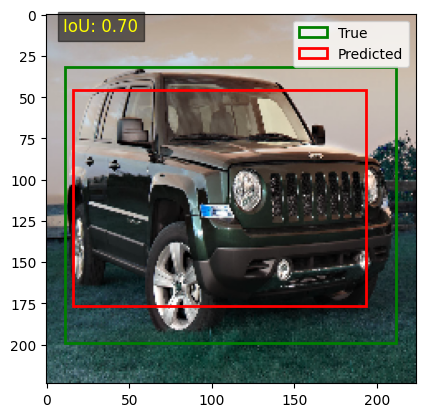

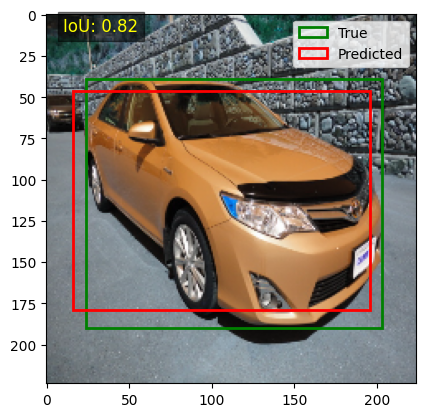

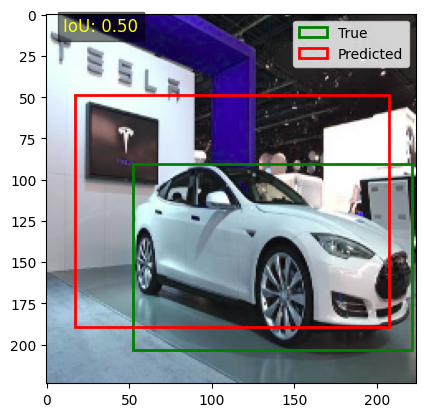

...

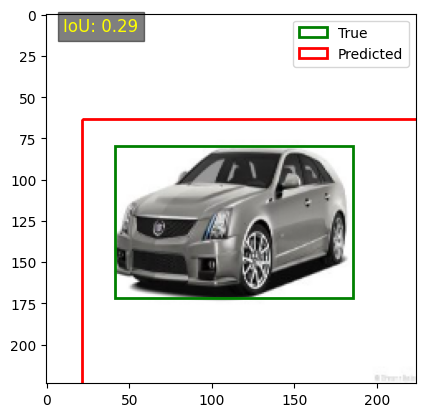

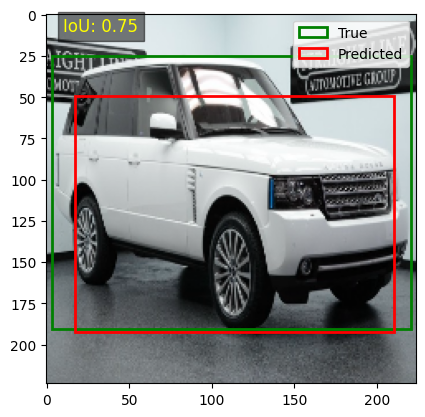

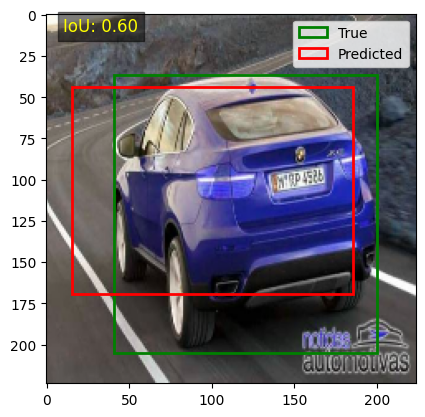

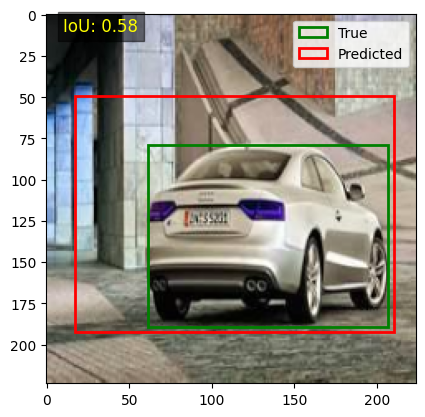

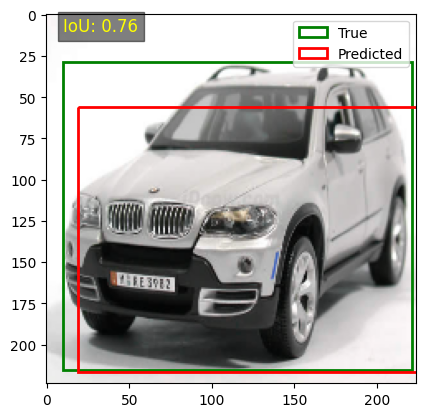

Mean IoU over the dataset: 0.6145


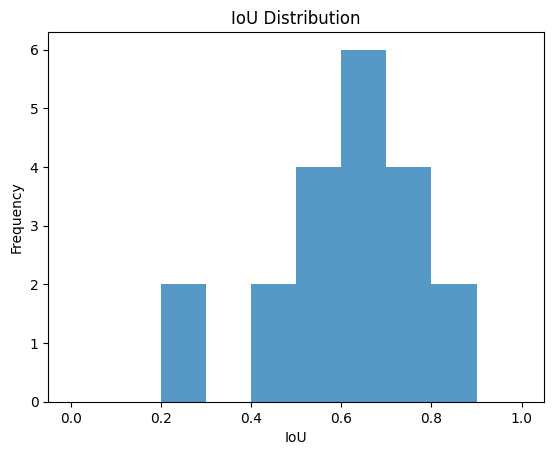

In [ ]:
# Evaluate IoU and visualize predictions
total_iou = 0
n_samples = len(test_dataset)
iou_scores = []
len = 20

for i in range(len):  # Adjust this number to visualize more samples
    image = images[i]
    true_bbox = true_bboxes[i]
    pred_bbox = pred_bboxes[i]

    # Calculate IoU for the current prediction
    iou = calculate_iou(true_bbox, pred_bbox)
    iou_scores.append(iou)

    # Plot the image with bounding boxes and IoU
    plot_bounding_boxes(image, true_bbox, pred_bbox, iou=iou)

    total_iou += iou

# Calculate mean IoU across the dataset
mean_iou = total_iou / len
print(f'Mean IoU over the dataset: {mean_iou:.4f}')

# Optional: Plot IoU distribution
plt.hist(iou_scores, bins=10, range=(0, 1), alpha=0.75)
plt.xlabel("IoU")
plt.ylabel("Frequency")
plt.title("IoU Distribution")
plt.show()

**Observations:**<br>
The CNN layers and the Fully connected layers take in the input (image and bounding box coordinates) and with the help of MSE and backpropagation tend to arrive at best bounding box co-ordinates available. The model trained on 1000 images so far able to re-produce the bounding box for new images at a rate of 61%. If the model is able to train on more images and the parameters are fine-tuned correctly then the model would produce good efficiency

## Object Detection (Faster RCNN)

In [ ]:
#Importing Libraries
from PIL import Image
import cv2
import numpy as np
import torch
import torchvision
from torch.utils.data import Dataset, DataLoader
import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.ops import nms
import matplotlib.pyplot as plt
import pandas as pd
import glob

In [ ]:
# Select first 1000 images from train and test randomly (Time taking for training model is too high)
train_annotation_v1_subset = train_annotation_v1.head(1000)
test_annotation_v1_subset = test_annotation_v1.head(1000)

# Create new column with image path
train_annotation_v1_subset["ImageID"] = "/Users/sathish/Documents/Machine_Learning/CarDetectionProject1/Car_Images/Train_Images"+"/"+train_annotation_v1_subset["car_name"] + "/"+train_annotation_v1_subset["image_name"]
test_annotation_v1_subset["ImageID"] = "/Users/sathish/Documents/Machine_Learning/CarDetectionProject1/Car_Images/Test_Images"+"/"+test_annotation_v1_subset["car_name"] + "/"+test_annotation_v1_subset["image_name"]

# Path of image folder.
IMG_ROOT = "/Users/sathish/Documents/Machine_Learning/CarDetectionProject1/Car_Images"

In [ ]:
# Create 2 target in image (car and background)
label2target = {'background': 0 , 'car' : 1  }
target2label = { t: l for l,t in  label2target.items()}
background_class = label2target['background']
num_classes = len(label2target)

In [ ]:
# Preprocessing the image data to change the image shape
def preprocess_image(img):
    img = torch.tensor(img).permute(2,0,1)
    return img.to(device).float()

def find(files_path):
    file_path_dict = {}
    for file_path in files_path:
        file_path_dict[file_path.split('/')[-1]] = file_path

    return file_path_dict

In [ ]:
# Function for Creating Train loading data with image and target values.
class OpenDataset(Dataset):
    def __init__(self, df, image_dir):
        self.w, self.h = 224, 224
        self.image_dir = image_dir
        self.files = glob.glob( self.image_dir + '/*' )
        self.df = df.copy()
        self.image_infos = df.ImageID.unique()
        self.find_image_path = find(self.files)

    def __getitem__(self, ix):
        # load images and masks
        image_id = self.image_infos[ix]
        img_path = image_id
        img = Image.open(img_path).convert("RGB")
        data = self.df[self.df['ImageID'] == image_id]
        H, W , _ = np.array(img).shape
        # Normalise the dimension of the bounding boxes
        data.loc[:, ['x_min', 'y_min', 'x_max', 'y_max']] /= [W, H, W, H]
        # Normalise the value of the images from 0 to 1
        img = np.array(img.resize((self.w, self.h), resample=Image.BILINEAR))/255.
        labels = ['car'] * len(data)
        data = data[['x_min','y_min','x_max','y_max']].values
        # Regenerate the dimension of the bounding boxes of the new size (224,224)
        data[:,[0,2]] *= self.w
        data[:,[1,3]] *= self.h
        boxes = data.astype(np.uint32).tolist()
        target = {}
        # For each image we are creating the boxes and labels
        target["boxes"] = torch.Tensor(boxes).float()
        target["labels"] = torch.Tensor([label2target[i] for i in labels]).long()
        # Processing the image
        img = preprocess_image(img)
        # Return the image
        return img, target

    def collate_fn(self, batch):
        """ The Function takes a batch of data and rearranges it into a format suitable for processing. """
        return tuple(zip(*batch))

    def __len__(self):
        return len(self.image_infos)

In [ ]:
%%time

# Calling Function 'OpenDataset' to preprocess train and test dataset
train_ds = OpenDataset(train_annotation_v1_subset, IMG_ROOT)
test_ds = OpenDataset(test_annotation_v1_subset , IMG_ROOT)

# Creating Batches for the train and test dataset.
train_loader = DataLoader(train_ds, batch_size=4, collate_fn=train_ds.collate_fn, drop_last=True)
test_loader = DataLoader(test_ds, batch_size=4, collate_fn=test_ds.collate_fn, drop_last=True)

CPU times: user 4.66 ms, sys: 0 ns, total: 4.66 ms
Wall time: 8.3 ms


In [ ]:
# Creating a function to call the model
def get_model():
    model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained = True)

    in_features = model.roi_heads.box_predictor.cls_score.in_features

    model.roi_heads.box_predictor = FastRCNNPredictor(in_features
                                                    , num_classes)
    return model

In [ ]:
# Creating batch functions to batch the inputs - images and targets (bounding box coordinates)
def train_batch(inputs, model, optimizer):
    model.train()
    input, targets = inputs
    input = list(image.to(device) for image in input)
    targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
    optimizer.zero_grad()
    losses = model(input, targets)
    loss = sum(loss for loss in losses.values())
    loss.backward()
    optimizer.step()
    return loss, losses

@torch.no_grad() # this will disable gradient computation in the function below
def validate_batch(inputs, model):
    model.train() # to obtain the losses, model needs to be in train mode only. # #Note that here we are not defining the model's forward method
    #and hence need to work per the way the model class is defined
    input, targets = inputs
    input = list(image.to(device) for image in input)
    targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

    optimizer.zero_grad()
    losses = model(input, targets)
    loss = sum(loss for loss in losses.values())
    return loss, losses

In [ ]:
# Checking if the 'GPU' device is avaiable
device = 'cuda' if torch.cuda.is_available() else 'cpu'

In [ ]:
# Downloading the Pretrained model
model = get_model().to(device)
optimizer = torch.optim.SGD(model.parameters(), lr=0.0005,
                            momentum=0.9, weight_decay=0.0005)

Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth
100%|██████████| 160M/160M [00:01<00:00, 118MB/s]


In [ ]:
#Training the function and getting loss values.
n_epochs = 5
best_valid_loss = float("inf")
patience = 8  # Number of epochs to wait for improvement
patience_counter = 0
for epoch in range(n_epochs):
    _n = len(train_loader)

    for ix, inputs in enumerate(train_loader):
        loss, losses = train_batch(inputs, model, optimizer)
        loc_loss, regr_loss, loss_objectness, loss_rpn_box_reg = \
                [losses[k] for k in ['loss_classifier', 'loss_box_reg', 'loss_objectness', 'loss_rpn_box_reg']]
        pos = (epoch + (ix + 1) / _n)

            # Print training loss details
    print(f"Epoch {epoch + 1}/{n_epochs}, "
                  f"Loss: {loss.item():.4f}, "
                  f"Loc Loss: {loc_loss.item():.4f}, "
                  f"Regr Loss: {regr_loss.item():.4f}, "
                  f"Objectness Loss: {loss_objectness.item():.4f}, "
                  f"RPN Box Reg Loss: {loss_rpn_box_reg.item():.4f}", end='\n')



    _n = len(test_loader)
    for ix, inputs in enumerate(test_loader):
        loss, losses = validate_batch(inputs, model)
        loc_loss, regr_loss, loss_objectness, loss_rpn_box_reg = \
            [losses[k] for k in ['loss_classifier', 'loss_box_reg', 'loss_objectness', 'loss_rpn_box_reg']]
        pos = (epoch + (ix + 1) / _n)

    # Save the best model
    if loss < best_valid_loss:
        best_valid_loss = loss
        torch.save(model.state_dict(), "tut2-model.pt")
        patience_counter = 0  # Reset the patience counter if validation loss improves
    else:
        patience_counter += 1

    print(f'Epoch {epoch + 1}/{n_epochs}, '
              f"Val Loss: {loss.item():.4f}, "
              f"Val Loc Loss: {loc_loss.item():.4f}, "
              f"Val Regr Loss: {regr_loss.item():.4f}, "
              f"Val Objectness Loss: {loss_objectness.item():.4f}, "
              f"Val RPN Box Reg Loss: {loss_rpn_box_reg.item():.4f}", end='\n')

    if patience_counter >= patience:
        print("\nEarly stopping triggered")
        break


model.load_state_dict(torch.load("tut2-model.pt"))

Epoch 1/5, Loss: 0.0510, Loc Loss: 0.0176, Regr Loss: 0.0257, Objectness Loss: 0.0061, RPN Box Reg Loss: 0.0017
Epoch 1/5, Val Loss: 0.0376, Val Loc Loss: 0.0136, Val Regr Loss: 0.0202, Val Objectness Loss: 0.0008, Val RPN Box Reg Loss: 0.0030
Epoch 2/5, Loss: 0.0349, Loc Loss: 0.0134, Regr Loss: 0.0201, Objectness Loss: 0.0001, RPN Box Reg Loss: 0.0013
Epoch 2/5, Val Loss: 0.0291, Val Loc Loss: 0.0126, Val Regr Loss: 0.0133, Val Objectness Loss: 0.0002, Val RPN Box Reg Loss: 0.0029
Epoch 3/5, Loss: 0.0334, Loc Loss: 0.0124, Regr Loss: 0.0197, Objectness Loss: 0.0002, RPN Box Reg Loss: 0.0011
Epoch 3/5, Val Loss: 0.0304, Val Loc Loss: 0.0126, Val Regr Loss: 0.0126, Val Objectness Loss: 0.0025, Val RPN Box Reg Loss: 0.0026
Epoch 4/5, Loss: 0.0285, Loc Loss: 0.0106, Regr Loss: 0.0168, Objectness Loss: 0.0001, RPN Box Reg Loss: 0.0011
Epoch 4/5, Val Loss: 0.0207, Val Loc Loss: 0.0074, Val Regr Loss: 0.0106, Val Objectness Loss: 0.0002, Val RPN Box Reg Loss: 0.0024
Epoch 5/5, Loss: 0.0241,

<All keys matched successfully>

In [ ]:
# Getting the output to store in a list structure
def decode_output(output):
    bbs = output['boxes'].cpu().detach().numpy().astype(np.uint16)
    labels = np.array([target2label[i] for i in output['labels'].cpu().detach().numpy()])
    confs = output['scores'].cpu().detach().numpy()
    ixs = nms(torch.tensor(bbs.astype(np.float32)), torch.tensor(confs), 0.05)
    bbs, confs, labels = [tensor[ixs] for tensor in [bbs, confs, labels]]

    if len(ixs) == 1:
        bbs, confs, labels = [np.array([tensor]) for tensor in [bbs, confs, labels]]
    return bbs.tolist(), confs.tolist(), labels.tolist()

In [ ]:
# Extracting the bounding boxes, confidence scores, and labels on an image using a function
def plot_bbs_confs_labels(image, bbs, confs, labels, label_colors=None):
    image_with_bbs = image.copy()

    if label_colors is None:
        label_colors = {}

    for bb, conf, label in zip(bbs, confs, labels):
        x, y, w, h = bb
        color = label_colors.get(label, (0, 255, 0))  # Default color is green

        # Drawing the bounding box
        cv2.rectangle(image_with_bbs, (x, y), ( w,  h), color, 2)

        # Preparing the label text
        text = f"{label}: {conf:.2f}"
        (text_width, text_height), baseline = cv2.getTextSize(text, cv2.FONT_HERSHEY_SIMPLEX, 0.5, 1)
        cv2.rectangle(image_with_bbs, (x, y), (x + text_width, y - text_height - baseline), color, cv2.FILLED)
        cv2.putText(image_with_bbs, text, (x, y - baseline), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 2)

    return image_with_bbs

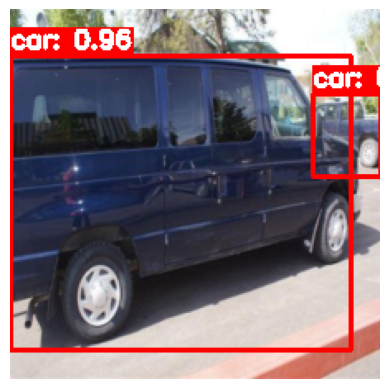

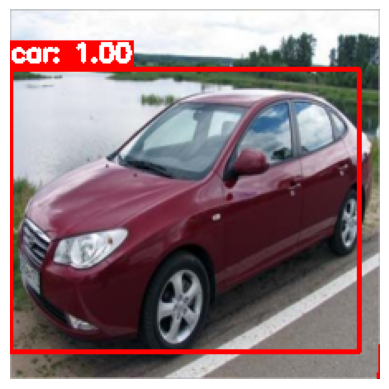

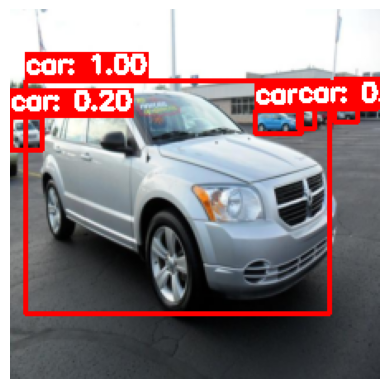

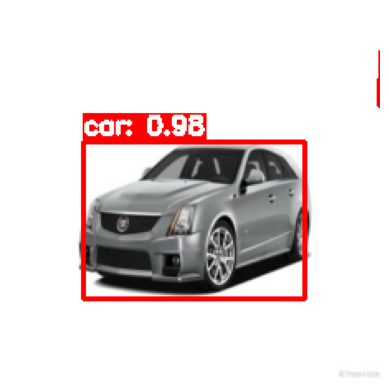

In [ ]:
# Evaluting the model on test dataset
model.eval()
for ix, (images, targets) in enumerate(test_loader):
    if ix==3:
      images = [im for im in images]
      outputs = model(images)
      label_colors = {'car': (255, 0, 0)}
      for ix, output in enumerate(outputs):
          bbs, confs, labels = decode_output(output)
          image_with_bbs = plot_bbs_confs_labels(images[ix].cpu().permute(1,2,0).numpy(), bbs, confs, labels, label_colors)

          # Displaying the image with bounding boxes
          plt.imshow(image_with_bbs)
          plt.axis('off')
          plt.show()

**Observations:**<br>
The faster R-CNN model with an open backbone with pre-trained weights gives much better accuracy than the model that is built out from scratch. In general, the model can identify cars in as many instances in a single image. Choosing more advanced models with less computational effort can give us better accuracy

# Part 8: Pickling the best model for future prediction

Saving the best object classification model (i.e., Inception V3) as a Keras file

In [ ]:
# Saving the InceptionV3 model as a Keras file
model_googlenet.save('model_googlenet.keras')

In [ ]:
# Loading the model onto python notebook
from tensorflow.keras.models import load_model
model_googlenet_1=load_model('model_googlenet.keras')

Saving the best object detection model (i.e., Faster R-CNN) as a pytorch file

In [ ]:
# Saving the Faster R-CNN to a pytorch object
torch.save(model.state_dict(), "tut2-model.pt")

In [ ]:
# Loading the Faster R-CNN onto the python notebook
model.load_state_dict(torch.load("tut2-model.pt"))

# Recommendations:

•	Utilizing transfer learning by fine-tuning pre-trained models on similar tasks to leverage existing knowledge and reduce training time. Models like YOLO and SSD can improve accuracy, as these models are trained on various object types and excel in vehicle detection.<br>
•	Collecting a wide variety of refined images for each class enhances the likelihood of achieving a successful model.<br>
•	Investigating and fine-tuning all model parameters can lead to better results. Systematically experimenting with different hyperparameters (e.g., learning rate, batch size) to find the optimal settings for model training.<br>
•	Using cross-validation to better understand the model’s performance and avoid overfitting by testing on multiple subsets of the data.<br>
•	Monitoring additional performance metrics (e.g., precision, recall, F1 score) beyond accuracy to gain a comprehensive understanding of the model's effectiveness.<br>